In [ ]:
# Cell 1: Setup and Imports
from google.colab import drive
drive.mount('/content/drive')

!pip install pandas numpy pillow torch torchvision scikit-learn efficientnet_pytorch

import os
import pandas as pd
import numpy as np
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from sklearn.model_selection import train_test_split
import torch.nn as nn
import torch.optim as optim
from efficientnet_pytorch import EfficientNet
from sklearn.metrics import accuracy_score, roc_auc_score, recall_score
import warnings
import time
from datetime import datetime
import zipfile

warnings.filterwarnings("ignore")

Mounted at /content/drive
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 122.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 97.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 60.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 43.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 18.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 111.8 MB/s eta 0:00:00
  Created wheel for efficientnet_pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16426 sha256=0661479312749a6dcb6

In [ ]:
# Cell 2: Configuration and Paths
# Updated paths as requested
ZIP_PATH = '/content/drive/MyDrive/400mal_600ben/400mal_600ben_224.zip'
EXTRACT_DIR = '/content/400mal_600ben_224/400mal_600ben_224/400mal_600ben_224/400mal_600ben_224'  # Temporary extraction location
CSV_PATH = '/content/drive/MyDrive/benign950_malignant50/selected_samples.csv'

# Training Configuration
BATCH_SIZE = 2
IMAGE_SIZE = 224
EPOCHS = 15  # Changed to 15 epochs for testing
VERBOSE = True
PRINT_FREQ = 50
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Create directory for saving models
MODEL_SAVE_DIR = '/content/drive/MyDrive/epoch_models'
os.makedirs(MODEL_SAVE_DIR, exist_ok=True)

print(f"Using device: {DEVICE}")
print(f"CSV Path: {CSV_PATH}")
print(f"Model save directory: {MODEL_SAVE_DIR}")

Using device: cuda
CSV Path: /content/drive/MyDrive/benign950_malignant50/selected_samples.csv
Model save directory: /content/drive/MyDrive/epoch_models


In [ ]:
# Cell 3: Extract Dataset
# Step 1: Extract ZIP only if not extracted before
if not os.path.exists(EXTRACT_DIR):
    with zipfile.ZipFile(ZIP_PATH, 'r') as zip_ref:
        zip_ref.extractall(EXTRACT_DIR)
        print("Zip extracted successfully.")

# Step 2: Image Directory inside extracted folder
IMAGE_DIR = EXTRACT_DIR

# Check if CSV and images exist
assert os.path.exists(CSV_PATH), "CSV file not found!"
assert os.path.exists(IMAGE_DIR), "Image directory not found!"

# Count only image files with common image extensions
image_extensions = ('.jpg', '.jpeg', '.png')
file_count = len([name for name in os.listdir(IMAGE_DIR)
                  if name.lower().endswith(image_extensions) and os.path.isfile(os.path.join(IMAGE_DIR, name))])

print(f"Number of image files in directory '{IMAGE_DIR}': {file_count}")
print(f"Image Directory: {IMAGE_DIR}")

Number of image files in directory '/content/400mal_600ben_224/400mal_600ben_224/400mal_600ben_224/400mal_600ben_224': 1000
Image Directory: /content/400mal_600ben_224/400mal_600ben_224/400mal_600ben_224/400mal_600ben_224


In [ ]:
# Cell 4: Custom Dataset Class
class JPEGDataset(Dataset):
    def __init__(self, dataframe, root_dir=IMAGE_DIR, transform=None):
        self.dataframe = dataframe
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_name = os.path.join(self.root_dir, self.dataframe.iloc[idx]["image_name"] + ".jpg")
        try:
            image = Image.open(img_name).convert("RGB")
            if self.transform:
                image = self.transform(image)
            label = self.dataframe.iloc[idx]["target"]
            return image, torch.tensor(label, dtype=torch.float32)
        except Exception as e:
            print(f"Error loading {img_name}: {str(e)}")
            dummy_img = torch.zeros(3, IMAGE_SIZE, IMAGE_SIZE)
            return dummy_img, torch.tensor(0.0, dtype=torch.float32)

In [ ]:
# Cell 5: Data Preparation
def prepare_data_with_test(csv_path, image_dir, test_size=0.2, val_size=0.2):
    df = pd.read_csv(csv_path)
    existing = set(os.path.splitext(f)[0] for f in os.listdir(image_dir) if f.endswith(".jpg"))
    df = df[df["image_name"].isin(existing)]
    df = df[["image_name", "target"]].dropna()

    # Split into test (10%)
    train_val_df, test_df = train_test_split(
        df, test_size=test_size, random_state=42, stratify=df["target"]
    )

    # Split train_val into train/val (10% val of remaining)
    val_frac = val_size / (1 - test_size)
    train_df, val_df = train_test_split(
        train_val_df, test_size=val_frac, random_state=42, stratify=train_val_df["target"]
    )

    print(f"Train: {len(train_df)}, Val: {len(val_df)}, Test: {len(test_df)}")
    print(f"Train distribution - Benign: {len(train_df[train_df['target']==0])}, Malignant: {len(train_df[train_df['target']==1])}")
    print(f"Val distribution - Benign: {len(val_df[val_df['target']==0])}, Malignant: {len(val_df[val_df['target']==1])}")
    print(f"Test distribution - Benign: {len(test_df[test_df['target']==0])}, Malignant: {len(test_df[test_df['target']==1])}")

    transform = transforms.Compose([
        transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    train_ds = JPEGDataset(train_df, root_dir=image_dir, transform=transform)
    val_ds   = JPEGDataset(val_df, root_dir=image_dir, transform=transform)
    test_ds  = JPEGDataset(test_df, root_dir=image_dir, transform=transform)

    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
    val_loader   = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)
    test_loader  = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

    return train_loader, val_loader, test_loader, train_df, val_df, test_df

In [ ]:
# Cell 6: Model Setup
def setup_model():
    model = EfficientNet.from_pretrained("efficientnet-b0")
    model._fc = nn.Linear(model._fc.in_features, 1)
    model = model.to(DEVICE)

    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-4)

    return model, criterion, optimizer

In [ ]:
# Cell 7: Evaluation Function
def evaluate_model(model, loader, dataset_name=""):
    model.eval()
    all_preds, all_labels = [], []

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(DEVICE)
            outputs = model(images)
            preds = torch.sigmoid(outputs).cpu().numpy().flatten()
            all_preds.extend(preds)
            all_labels.extend(labels.numpy().flatten())

    bin_preds = [1 if p >= 0.5 else 0 for p in all_preds]

    acc = accuracy_score(all_labels, bin_preds)
    auc = roc_auc_score(all_labels, all_preds) if len(set(all_labels)) > 1 else 0.0
    recall = recall_score(all_labels, bin_preds) if len(set(all_labels)) > 1 else 0.0

    print(f"{dataset_name} Results:")
    print(f"  Accuracy: {acc:.4f}")
    print(f"  AUC: {auc:.4f}")
    print(f"  Recall: {recall:.4f}")

    return acc, auc, recall

In [ ]:
# Cell 8: Main Training Loop with Epoch Testing
def train_and_evaluate_epochs(model, criterion, optimizer, train_loader, val_loader, test_loader):
    results_log = []

    print(f"Starting training for {EPOCHS} epochs...")
    overall_start_time = datetime.now()
    print(f"Training started at: {overall_start_time.strftime('%Y-%m-%d %H:%M:%S')}")

    for epoch in range(EPOCHS):
        # Log epoch start time
        epoch_start_time = datetime.now()
        print(f"\nEpoch {epoch+1}/{EPOCHS} started at: {epoch_start_time.strftime('%Y-%m-%d %H:%M:%S')}")

        # Training phase
        model.train()
        running_loss = 0.0
        total_samples = 0

        for batch_idx, (images, labels) in enumerate(train_loader):
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs.flatten(), labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * images.size(0)
            total_samples += images.size(0)

            if VERBOSE and (batch_idx % PRINT_FREQ == 0 or batch_idx == len(train_loader) - 1):
                print(f"  Batch {batch_idx+1}/{len(train_loader)} | Loss: {loss.item():.4f}")

        train_loss = running_loss / total_samples

        # Validation phase
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(DEVICE), labels.to(DEVICE)
                outputs = model(images)
                loss = criterion(outputs.flatten(), labels)
                val_loss += loss.item() * images.size(0)
        val_loss /= len(val_loader.dataset)

        # Log epoch end time
        epoch_end_time = datetime.now()
        epoch_duration = epoch_end_time - epoch_start_time
        print(f"Epoch {epoch+1} ended at: {epoch_end_time.strftime('%Y-%m-%d %H:%M:%S')}")
        print(f"Epoch {epoch+1} duration: {epoch_duration}")

        # Save model for this epoch
        model_save_path = os.path.join(MODEL_SAVE_DIR, f'CLASSImbalance_images_efficientnet_b0_epoch_{epoch+1}.pth')
        torch.save({
            'epoch': epoch + 1,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'train_loss': train_loss,
            'val_loss': val_loss,
        }, model_save_path)

        print(f"Model saved at: {model_save_path}")
        print(f"Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")

        # Evaluate on all datasets
        print(f"\nEvaluating Epoch {epoch+1} model:")
        train_acc, train_auc, train_recall = evaluate_model(model, train_loader, "Train")
        val_acc, val_auc, val_recall = evaluate_model(model, val_loader, "Validation")
        test_acc, test_auc, test_recall = evaluate_model(model, test_loader, "Test")

        # Log results
        epoch_results = {
            'epoch': epoch + 1,
            'epoch_start_time': epoch_start_time.strftime('%Y-%m-%d %H:%M:%S'),
            'epoch_end_time': epoch_end_time.strftime('%Y-%m-%d %H:%M:%S'),
            'epoch_duration': str(epoch_duration),
            'train_loss': train_loss,
            'val_loss': val_loss,
            'train_acc': train_acc,
            'train_auc': train_auc,
            'train_recall': train_recall,
            'val_acc': val_acc,
            'val_auc': val_auc,
            'val_recall': val_recall,
            'test_acc': test_acc,
            'test_auc': test_auc,
            'test_recall': test_recall,
            'model_path': model_save_path
        }
        results_log.append(epoch_results)

        print("-" * 80)

    overall_end_time = datetime.now()
    total_duration = overall_end_time - overall_start_time
    print(f"\nTotal training completed at: {overall_end_time.strftime('%Y-%m-%d %H:%M:%S')}")
    print(f"Total training duration: {total_duration}")

    return results_log

In [ ]:
# Cell 9: Execute Training and Data Preparation
# Prepare data
train_loader, val_loader, test_loader, train_df, val_df, test_df = prepare_data_with_test(CSV_PATH, IMAGE_DIR)

# Setup model
model, criterion, optimizer = setup_model()

# Train and evaluate across epochs
results_log = train_and_evaluate_epochs(model, criterion, optimizer, train_loader, val_loader, test_loader)

Train: 390, Val: 130, Test: 130
Train distribution - Benign: 360, Malignant: 30
Val distribution - Benign: 120, Malignant: 10
Test distribution - Benign: 120, Malignant: 10


Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b0-355c32eb.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b0-355c32eb.pth
100%|██████████| 20.4M/20.4M [00:00<00:00, 37.9MB/s]


Loaded pretrained weights for efficientnet-b0
Starting training for 15 epochs...
Training started at: 2025-06-23 06:45:18

Epoch 1/15 started at: 2025-06-23 06:45:18
  Batch 1/195 | Loss: 0.6670
  Batch 51/195 | Loss: 0.3585
  Batch 101/195 | Loss: 0.1898
  Batch 151/195 | Loss: 0.1722
  Batch 195/195 | Loss: 0.1138
Epoch 1 ended at: 2025-06-23 06:45:29
Epoch 1 duration: 0:00:11.335524
Model saved at: /content/drive/MyDrive/epoch_models/CLASSImbalance_images_efficientnet_b0_epoch_1.pth
Train Loss: 0.3852 | Val Loss: 0.3442

Evaluating Epoch 1 model:
Train Results:
  Accuracy: 0.9179
  AUC: 0.7455
  Recall: 0.0000
Validation Results:
  Accuracy: 0.9000
  AUC: 0.5550
  Recall: 0.0000
Test Results:
  Accuracy: 0.9077
  AUC: 0.7500
  Recall: 0.2000
--------------------------------------------------------------------------------

Epoch 2/15 started at: 2025-06-23 06:45:39
  Batch 1/195 | Loss: 0.6643
  Batch 51/195 | Loss: 0.0872
  Batch 101/195 | Loss: 0.0699
  Batch 151/195 | Loss: 0.0867

Results saved to: /content/drive/MyDrive/epoch_models/epoch_comparison_results.csv

Epoch Comparison Summary:
Epoch  Train Loss   Val Loss   Test Acc   Test AUC   Test Recall  Duration    
----------------------------------------------------------------------------------------------------
1      0.3852       0.3442     0.9077     0.7500     0.2000       0:00:11.335524
2      0.2585       0.2985     0.8923     0.7100     0.1000       0:00:10.279074
3      0.2049       0.3793     0.9077     0.7642     0.3000       0:00:10.373086
4      0.1812       0.3742     0.8308     0.6833     0.2000       0:00:10.099255
5      0.1403       0.5528     0.6692     0.7092     0.4000       0:00:10.011430
6      0.1290       0.4375     0.7615     0.6933     0.5000       0:00:10.017879
7      0.1044       0.3658     0.8077     0.7825     0.4000       0:00:09.981763
8      0.0622       0.3691     0.7923     0.7283     0.4000       0:00:10.078839
9      0.0778       0.4882     0.7308     0.7667     0.7000   

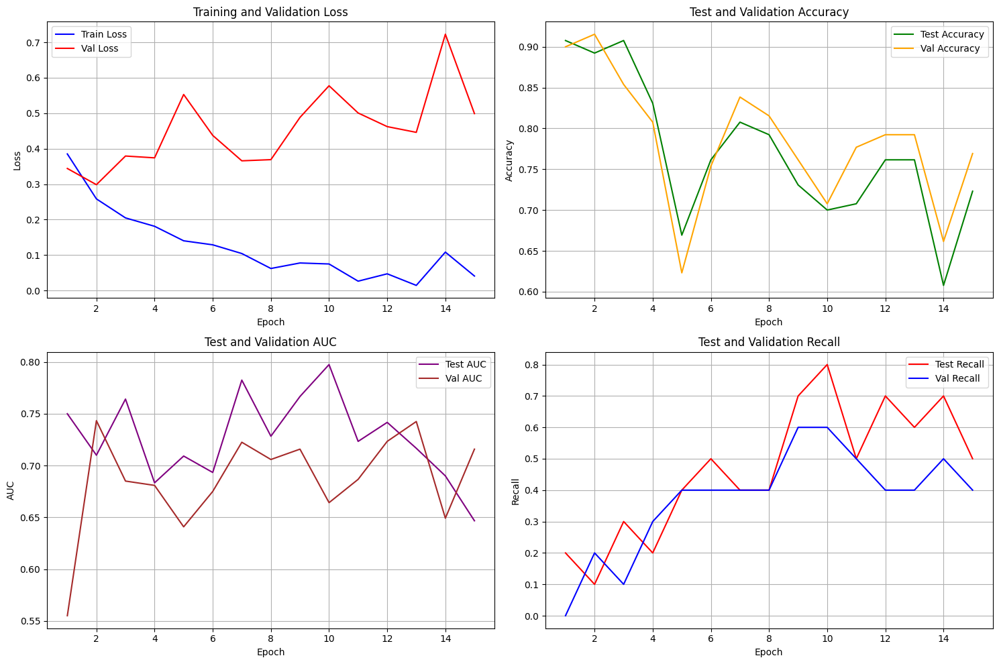


All models saved in: /content/drive/MyDrive/epoch_models
Training complete!


In [ ]:
# Cell 10: Results Analysis and Summary
# Convert results to DataFrame for analysis
results_df = pd.DataFrame(results_log)

# Save results to CSV
results_csv_path = os.path.join(MODEL_SAVE_DIR, 'epoch_comparison_results.csv')
results_df.to_csv(results_csv_path, index=False)
print(f"Results saved to: {results_csv_path}")

# Display summary
print("\nEpoch Comparison Summary:")
print("=" * 100)
print(f"{'Epoch':<6} {'Train Loss':<12} {'Val Loss':<10} {'Test Acc':<10} {'Test AUC':<10} {'Test Recall':<12} {'Duration':<12}")
print("-" * 100)

for _, row in results_df.iterrows():
    print(f"{row['epoch']:<6} {row['train_loss']:<12.4f} {row['val_loss']:<10.4f} "
          f"{row['test_acc']:<10.4f} {row['test_auc']:<10.4f} {row['test_recall']:<12.4f} {row['epoch_duration']:<12}")

# Find best epoch based on test accuracy
best_epoch_idx = results_df['test_recall'].idxmax()
best_epoch = results_df.loc[best_epoch_idx]

print(f"\nBest performing epoch: {best_epoch['epoch']}")
print(f"Best test accuracy: {best_epoch['test_acc']:.4f}")
print(f"Best test AUC: {best_epoch['test_auc']:.4f}")
print(f"Best test recall: {best_epoch['test_recall']:.4f}")
print(f"Best model path: {best_epoch['model_path']}")

# Plot training curves if matplotlib is available
try:
    import matplotlib.pyplot as plt

    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 10))

    epochs = results_df['epoch']

    # Loss curves
    ax1.plot(epochs, results_df['train_loss'], 'b-', label='Train Loss')
    ax1.plot(epochs, results_df['val_loss'], 'r-', label='Val Loss')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.set_title('Training and Validation Loss')
    ax1.legend()
    ax1.grid(True)

    # Accuracy curves
    ax2.plot(epochs, results_df['test_acc'], 'g-', label='Test Accuracy')
    ax2.plot(epochs, results_df['val_acc'], 'orange', label='Val Accuracy')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.set_title('Test and Validation Accuracy')
    ax2.legend()
    ax2.grid(True)

    # AUC curves
    ax3.plot(epochs, results_df['test_auc'], 'purple', label='Test AUC')
    ax3.plot(epochs, results_df['val_auc'], 'brown', label='Val AUC')
    ax3.set_xlabel('Epoch')
    ax3.set_ylabel('AUC')
    ax3.set_title('Test and Validation AUC')
    ax3.legend()
    ax3.grid(True)

    # Recall curves
    ax4.plot(epochs, results_df['test_recall'], 'red', label='Test Recall')
    ax4.plot(epochs, results_df['val_recall'], 'blue', label='Val Recall')
    ax4.set_xlabel('Epoch')
    ax4.set_ylabel('Recall')
    ax4.set_title('Test and Validation Recall')
    ax4.legend()
    ax4.grid(True)

    plt.tight_layout()
    plt.savefig(os.path.join(MODEL_SAVE_DIR, 'training_curves.png'), dpi=300, bbox_inches='tight')
    plt.show()

except ImportError:
    print("Matplotlib not available. Skipping plots.")

print(f"\nAll models saved in: {MODEL_SAVE_DIR}")
print("Training complete!")

In [ ]:
# Cell 11: Load and Test Best Model (Optional)
# Load the best performing model for further testing
def load_and_test_best_model():
    # Find best model path from results
    best_epoch_idx = results_df['test_recall'].idxmax()
    best_model_path = results_df.loc[best_epoch_idx, 'model_path']
    best_epoch_num = results_df.loc[best_epoch_idx, 'epoch']

    print(f"Loading best model from epoch {best_epoch_num}")
    print(f"Model path: {best_model_path}")

    # Setup fresh model architecture
    model, criterion, optimizer = setup_model()

    # Load the saved checkpoint
    checkpoint = torch.load(best_model_path)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.eval()

    print(f"Successfully loaded model from epoch {checkpoint['epoch']}")

    # Final evaluation on test set
    print("\nFinal evaluation with best model:")
    test_acc, test_auc, test_recall = evaluate_model(model, test_loader, "Final Test")

    return model, best_epoch_num, test_acc, test_auc, test_recall

# Uncomment the line below to load and test the best model
best_model, best_epoch_num, final_acc, final_auc, final_recall = load_and_test_best_model()

Loading best model from epoch 10
Model path: /content/drive/MyDrive/epoch_models/CLASSImbalance_images_efficientnet_b0_epoch_10.pth
Loaded pretrained weights for efficientnet-b0
Successfully loaded model from epoch 10

Final evaluation with best model:
Final Test Results:
  Accuracy: 0.7000
  AUC: 0.7975
  Recall: 0.8000


Evaluating Best Model with Confusion Matrix Analysis

Training Set Results:
Accuracy:     0.8410
AUC-ROC:      0.9947
Sensitivity (Recall): 1.0000
Specificity:  0.8278
Precision (PPV):      0.3261
NPV:          1.0000
F1-Score:     0.4918

Confusion Matrix:
True Negatives (TN):  298
False Positives (FP): 62
False Negatives (FN): 0
True Positives (TP):  30

Confusion matrix plot saved to: /content/drive/MyDrive/epoch_models/confusion_matrices/train_confusion_matrix_epoch_10.png


<Figure size 1000x800 with 0 Axes>

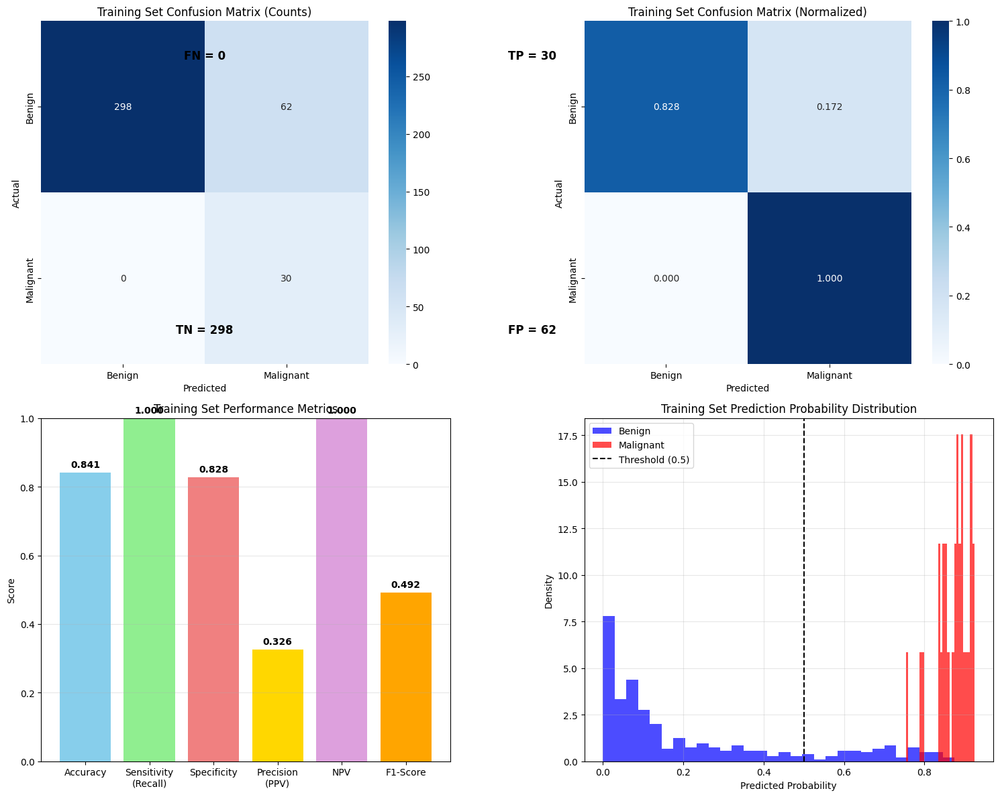


Classification Report:
              precision    recall  f1-score   support

      Benign     1.0000    0.8278    0.9058       360
   Malignant     0.3261    1.0000    0.4918        30

    accuracy                         0.8410       390
   macro avg     0.6630    0.9139    0.6988       390
weighted avg     0.9482    0.8410    0.8739       390


Validation Set Results:
Accuracy:     0.7077
AUC-ROC:      0.6642
Sensitivity (Recall): 0.6000
Specificity:  0.7167
Precision (PPV):      0.1500
NPV:          0.9556
F1-Score:     0.2400

Confusion Matrix:
True Negatives (TN):  86
False Positives (FP): 34
False Negatives (FN): 4
True Positives (TP):  6

Confusion matrix plot saved to: /content/drive/MyDrive/epoch_models/confusion_matrices/val_confusion_matrix_epoch_10.png


<Figure size 1000x800 with 0 Axes>

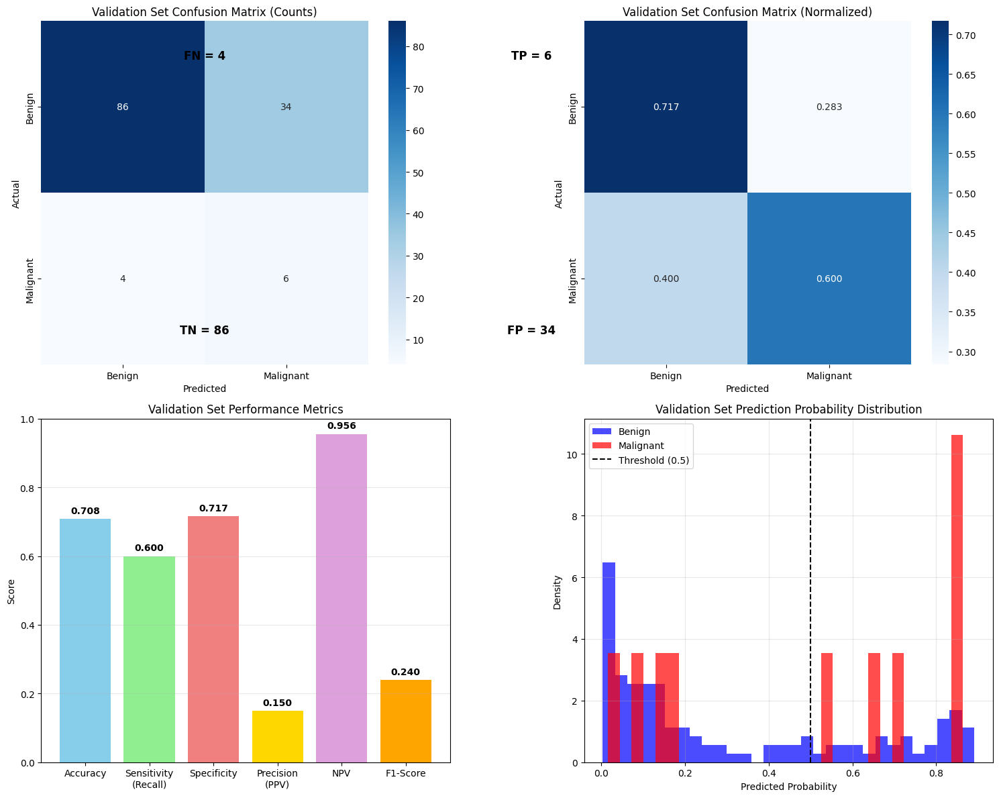


Classification Report:
              precision    recall  f1-score   support

      Benign     0.9556    0.7167    0.8190       120
   Malignant     0.1500    0.6000    0.2400        10

    accuracy                         0.7077       130
   macro avg     0.5528    0.6583    0.5295       130
weighted avg     0.8936    0.7077    0.7745       130


Test Set Results:
Accuracy:     0.7000
AUC-ROC:      0.7975
Sensitivity (Recall): 0.8000
Specificity:  0.6917
Precision (PPV):      0.1778
NPV:          0.9765
F1-Score:     0.2909

Confusion Matrix:
True Negatives (TN):  83
False Positives (FP): 37
False Negatives (FN): 2
True Positives (TP):  8

Confusion matrix plot saved to: /content/drive/MyDrive/epoch_models/confusion_matrices/test_confusion_matrix_epoch_10.png


<Figure size 1000x800 with 0 Axes>

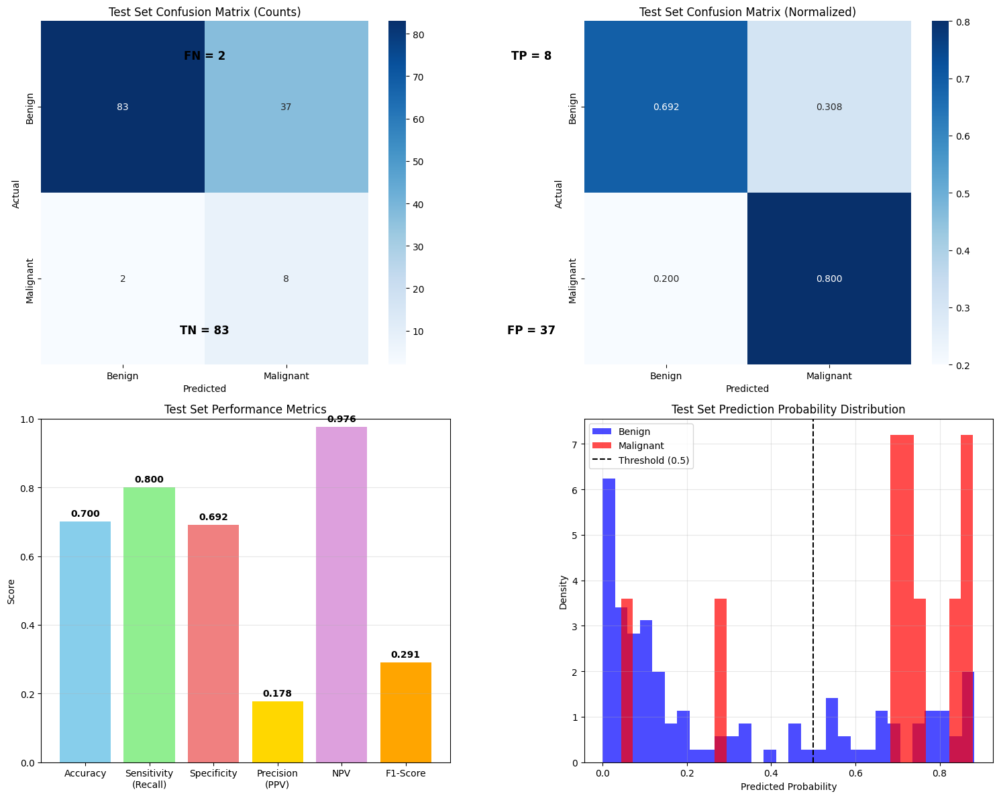


Classification Report:
              precision    recall  f1-score   support

      Benign     0.9765    0.6917    0.8098       120
   Malignant     0.1778    0.8000    0.2909        10

    accuracy                         0.7000       130
   macro avg     0.5771    0.7458    0.5503       130
weighted avg     0.9150    0.7000    0.7698       130


Threshold Analysis on Test Set


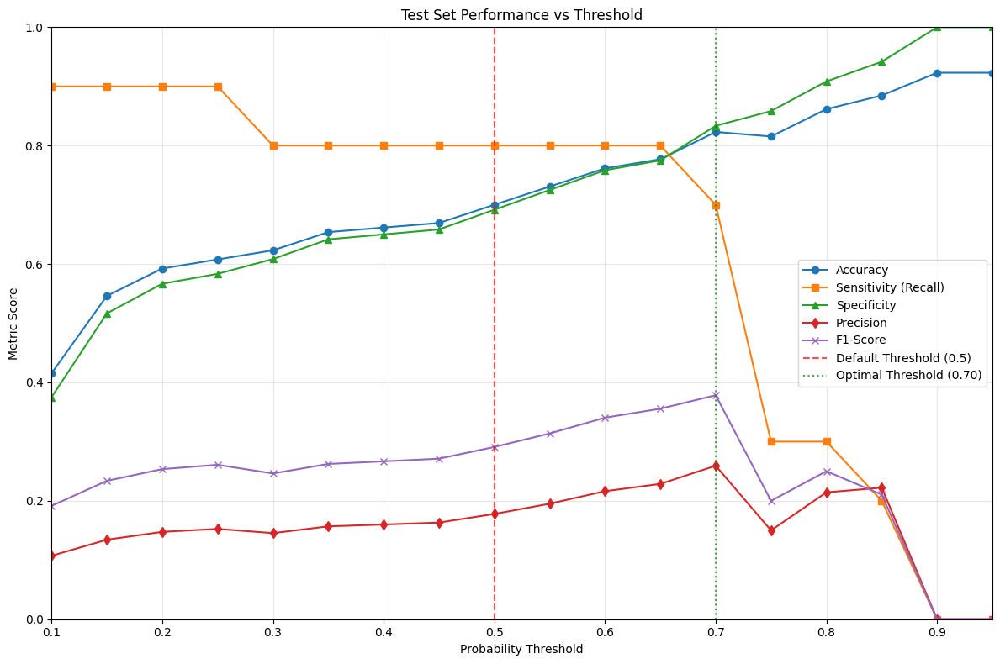


Optimal threshold based on F1-score: 0.700
F1-score at optimal threshold: 0.3784
Threshold analysis saved to: /content/drive/MyDrive/epoch_models/threshold_analysis.csv

Comprehensive Evaluation Summary:
      Dataset  Accuracy  Sensitivity_Recall  Specificity  Precision_PPV  \
0    Training    0.8410                 1.0       0.8278         0.3261   
1  Validation    0.7077                 0.6       0.7167         0.1500   
2        Test    0.7000                 0.8       0.6917         0.1778   

      NPV  F1_Score     AUC  True_Positives  True_Negatives  False_Positives  \
0  1.0000    0.4918  0.9947              30             298               62   
1  0.9556    0.2400  0.6642               6              86               34   
2  0.9765    0.2909  0.7975               8              83               37   

   False_Negatives  
0                0  
1                4  
2                2  

Optimal Threshold: 0.700
Summary saved to: /content/drive/MyDrive/epoch_models/comprehen

Results saved to: /content/drive/MyDrive/epoch_models/epoch_comparison_results.csv

Epoch Comparison Summary:
Epoch  Train Loss   Val Loss   Test Acc   Test AUC   Test Recall  Duration    
----------------------------------------------------------------------------------------------------
1      0.3852       0.3442     0.9077     0.7500     0.2000       0:00:11.335524
2      0.2585       0.2985     0.8923     0.7100     0.1000       0:00:10.279074
3      0.2049       0.3793     0.9077     0.7642     0.3000       0:00:10.373086
4      0.1812       0.3742     0.8308     0.6833     0.2000       0:00:10.099255
5      0.1403       0.5528     0.6692     0.7092     0.4000       0:00:10.011430
6      0.1290       0.4375     0.7615     0.6933     0.5000       0:00:10.017879
7      0.1044       0.3658     0.8077     0.7825     0.4000       0:00:09.981763
8      0.0622       0.3691     0.7923     0.7283     0.4000       0:00:10.078839
9      0.0778       0.4882     0.7308     0.7667     0.7000   

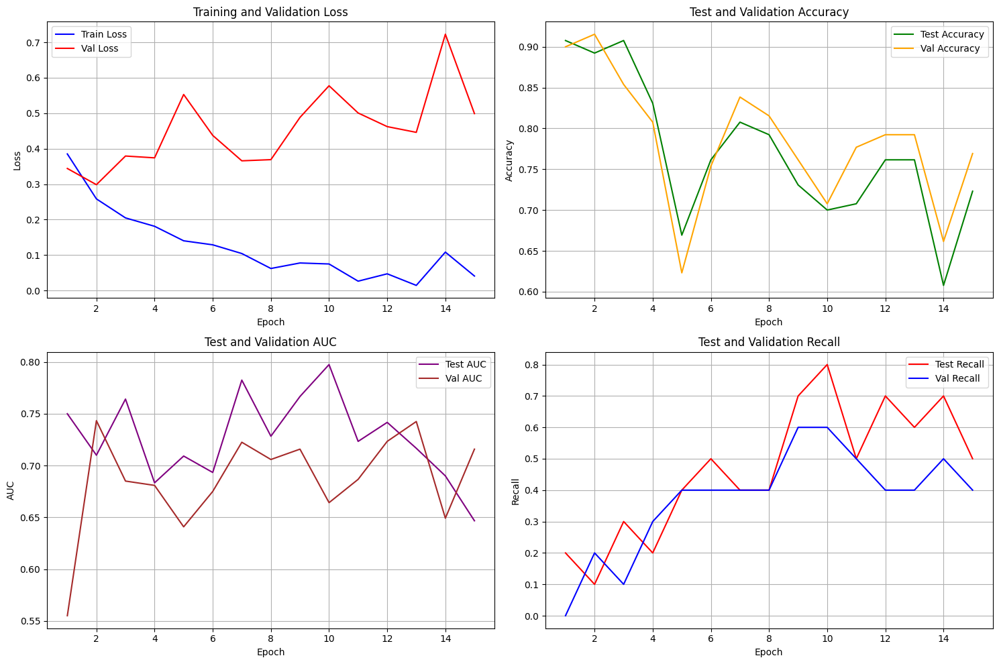


All models saved in: /content/drive/MyDrive/epoch_models
Training complete!


In [ ]:
# Cell 10: Results Analysis and Summary
# Convert results to DataFrame for analysis
results_df = pd.DataFrame(results_log)

# Save results to CSV
results_csv_path = os.path.join(MODEL_SAVE_DIR, 'epoch_comparison_results.csv')
results_df.to_csv(results_csv_path, index=False)
print(f"Results saved to: {results_csv_path}")

# Display summary
print("\nEpoch Comparison Summary:")
print("=" * 100)
print(f"{'Epoch':<6} {'Train Loss':<12} {'Val Loss':<10} {'Test Acc':<10} {'Test AUC':<10} {'Test Recall':<12} {'Duration':<12}")
print("-" * 100)

for _, row in results_df.iterrows():
    print(f"{row['epoch']:<6} {row['train_loss']:<12.4f} {row['val_loss']:<10.4f} "
          f"{row['test_acc']:<10.4f} {row['test_auc']:<10.4f} {row['test_recall']:<12.4f} {row['epoch_duration']:<12}")

# Find best epoch based on test accuracy
best_epoch_idx = results_df['test_acc'].idxmax()
best_epoch = results_df.loc[best_epoch_idx]

print(f"\nBest performing epoch: {best_epoch['epoch']}")
print(f"Best test accuracy: {best_epoch['test_acc']:.4f}")
print(f"Best test AUC: {best_epoch['test_auc']:.4f}")
print(f"Best test recall: {best_epoch['test_recall']:.4f}")
print(f"Best model path: {best_epoch['model_path']}")

# Plot training curves if matplotlib is available
try:
    import matplotlib.pyplot as plt

    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 10))

    epochs = results_df['epoch']

    # Loss curves
    ax1.plot(epochs, results_df['train_loss'], 'b-', label='Train Loss')
    ax1.plot(epochs, results_df['val_loss'], 'r-', label='Val Loss')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.set_title('Training and Validation Loss')
    ax1.legend()
    ax1.grid(True)

    # Accuracy curves
    ax2.plot(epochs, results_df['test_acc'], 'g-', label='Test Accuracy')
    ax2.plot(epochs, results_df['val_acc'], 'orange', label='Val Accuracy')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.set_title('Test and Validation Accuracy')
    ax2.legend()
    ax2.grid(True)

    # AUC curves
    ax3.plot(epochs, results_df['test_auc'], 'purple', label='Test AUC')
    ax3.plot(epochs, results_df['val_auc'], 'brown', label='Val AUC')
    ax3.set_xlabel('Epoch')
    ax3.set_ylabel('AUC')
    ax3.set_title('Test and Validation AUC')
    ax3.legend()
    ax3.grid(True)

    # Recall curves
    ax4.plot(epochs, results_df['test_recall'], 'red', label='Test Recall')
    ax4.plot(epochs, results_df['val_recall'], 'blue', label='Val Recall')
    ax4.set_xlabel('Epoch')
    ax4.set_ylabel('Recall')
    ax4.set_title('Test and Validation Recall')
    ax4.legend()
    ax4.grid(True)

    plt.tight_layout()
    plt.savefig(os.path.join(MODEL_SAVE_DIR, 'training_curves.png'), dpi=300, bbox_inches='tight')
    plt.show()

except ImportError:
    print("Matplotlib not available. Skipping plots.")

print(f"\nAll models saved in: {MODEL_SAVE_DIR}")
print("Training complete!")

In [ ]:
# Cell 11: Load and Test Best Model (Optional)
# Load the best performing model for further testing
def load_and_test_best_model():
    # Find best model path from results
    best_epoch_idx = results_df['test_acc'].idxmax()
    best_model_path = results_df.loc[best_epoch_idx, 'model_path']
    best_epoch_num = results_df.loc[best_epoch_idx, 'epoch']

    print(f"Loading best model from epoch {best_epoch_num}")
    print(f"Model path: {best_model_path}")

    # Setup fresh model architecture
    model, criterion, optimizer = setup_model()

    # Load the saved checkpoint
    checkpoint = torch.load(best_model_path)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.eval()

    print(f"Successfully loaded model from epoch {checkpoint['epoch']}")

    # Final evaluation on test set
    print("\nFinal evaluation with best model:")
    test_acc, test_auc, test_recall = evaluate_model(model, test_loader, "Final Test")

    return model, best_epoch_num, test_acc, test_auc, test_recall

# Uncomment the line below to load and test the best model
best_model, best_epoch_num, final_acc, final_auc, final_recall = load_and_test_best_model()

Loading best model from epoch 1
Model path: /content/drive/MyDrive/epoch_models/CLASSImbalance_images_efficientnet_b0_epoch_1.pth
Loaded pretrained weights for efficientnet-b0
Successfully loaded model from epoch 1

Final evaluation with best model:
Final Test Results:
  Accuracy: 0.9077
  AUC: 0.7500
  Recall: 0.2000


Evaluating Best Model with Confusion Matrix Analysis

Training Set Results:
Accuracy:     0.9179
AUC-ROC:      0.7455
Sensitivity (Recall): 0.0000
Specificity:  0.9944
Precision (PPV):      0.0000
NPV:          0.9227
F1-Score:     0.0000

Confusion Matrix:
True Negatives (TN):  358
False Positives (FP): 2
False Negatives (FN): 30
True Positives (TP):  0

Confusion matrix plot saved to: /content/drive/MyDrive/epoch_models/confusion_matrices/train_confusion_matrix_epoch_1.png


<Figure size 1000x800 with 0 Axes>

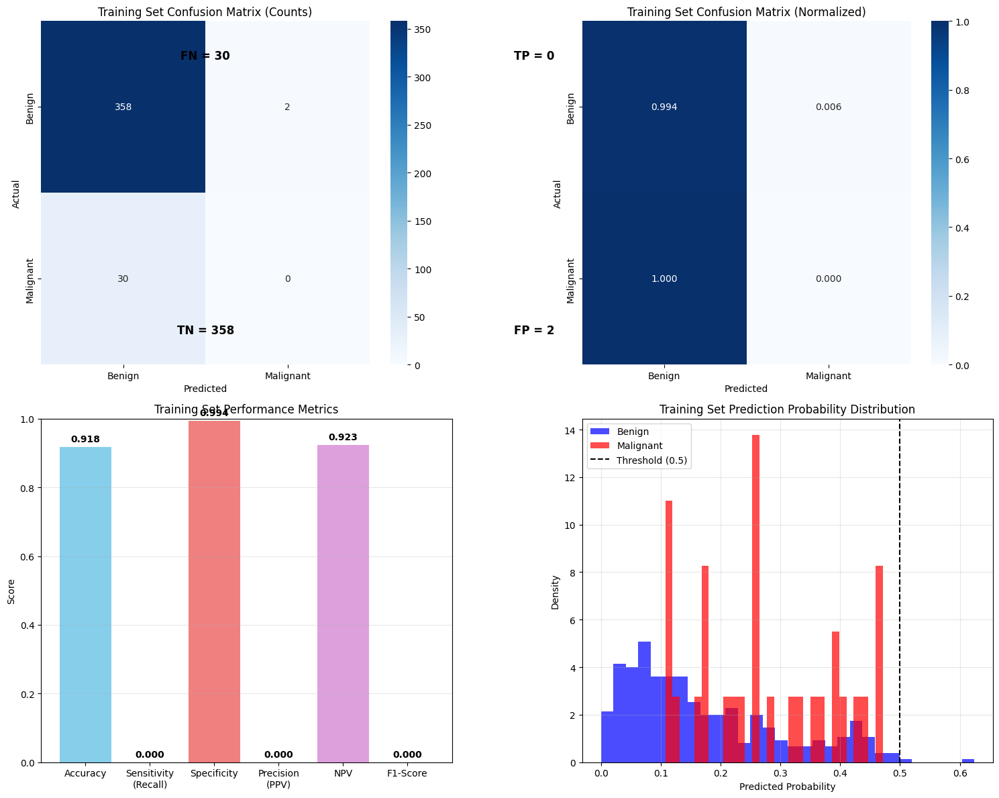


Classification Report:
              precision    recall  f1-score   support

      Benign     0.9227    0.9944    0.9572       360
   Malignant     0.0000    0.0000    0.0000        30

    accuracy                         0.9179       390
   macro avg     0.4613    0.4972    0.4786       390
weighted avg     0.8517    0.9179    0.8836       390


Validation Set Results:
Accuracy:     0.9000
AUC-ROC:      0.5550
Sensitivity (Recall): 0.0000
Specificity:  0.9750
Precision (PPV):      0.0000
NPV:          0.9213
F1-Score:     0.0000

Confusion Matrix:
True Negatives (TN):  117
False Positives (FP): 3
False Negatives (FN): 10
True Positives (TP):  0

Confusion matrix plot saved to: /content/drive/MyDrive/epoch_models/confusion_matrices/val_confusion_matrix_epoch_1.png


<Figure size 1000x800 with 0 Axes>

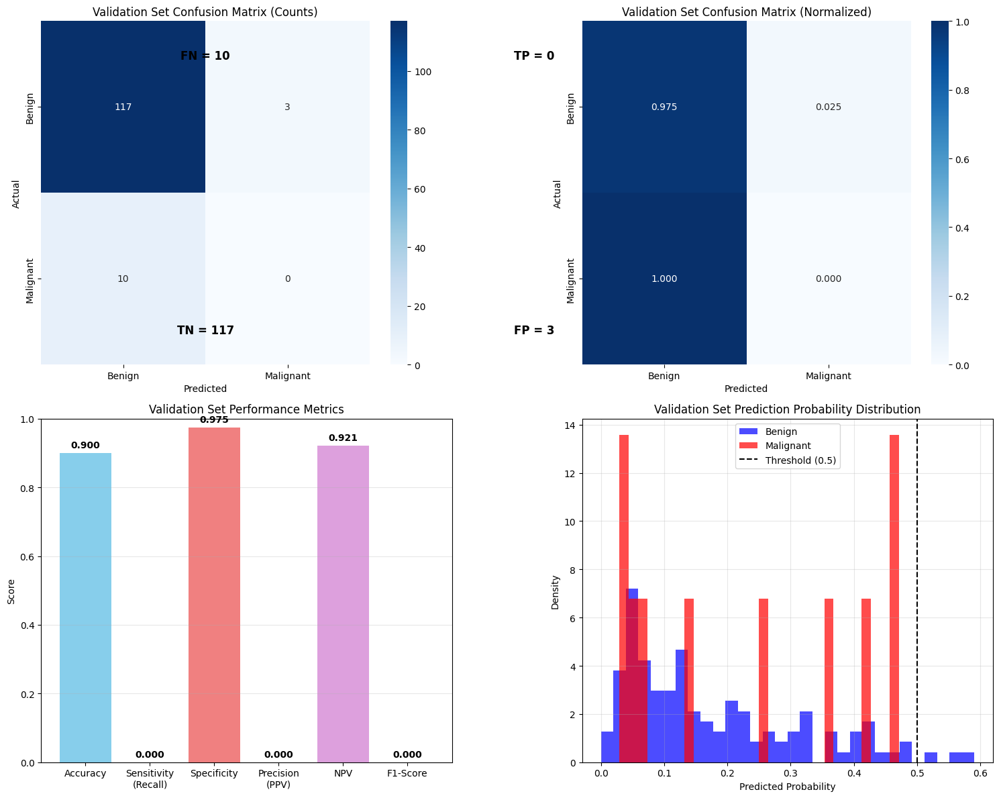


Classification Report:
              precision    recall  f1-score   support

      Benign     0.9213    0.9750    0.9474       120
   Malignant     0.0000    0.0000    0.0000        10

    accuracy                         0.9000       130
   macro avg     0.4606    0.4875    0.4737       130
weighted avg     0.8504    0.9000    0.8745       130


Test Set Results:
Accuracy:     0.9077
AUC-ROC:      0.7500
Sensitivity (Recall): 0.2000
Specificity:  0.9667
Precision (PPV):      0.3333
NPV:          0.9355
F1-Score:     0.2500

Confusion Matrix:
True Negatives (TN):  116
False Positives (FP): 4
False Negatives (FN): 8
True Positives (TP):  2

Confusion matrix plot saved to: /content/drive/MyDrive/epoch_models/confusion_matrices/test_confusion_matrix_epoch_1.png


<Figure size 1000x800 with 0 Axes>

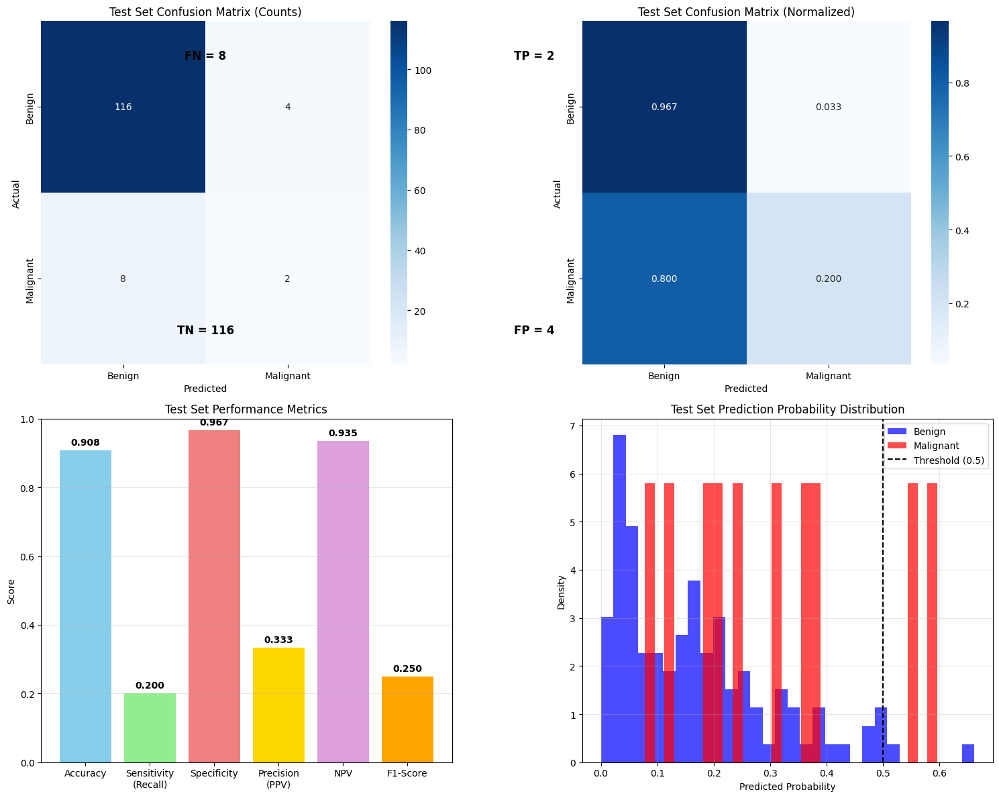


Classification Report:
              precision    recall  f1-score   support

      Benign     0.9355    0.9667    0.9508       120
   Malignant     0.3333    0.2000    0.2500        10

    accuracy                         0.9077       130
   macro avg     0.6344    0.5833    0.6004       130
weighted avg     0.8892    0.9077    0.8969       130


Threshold Analysis on Test Set


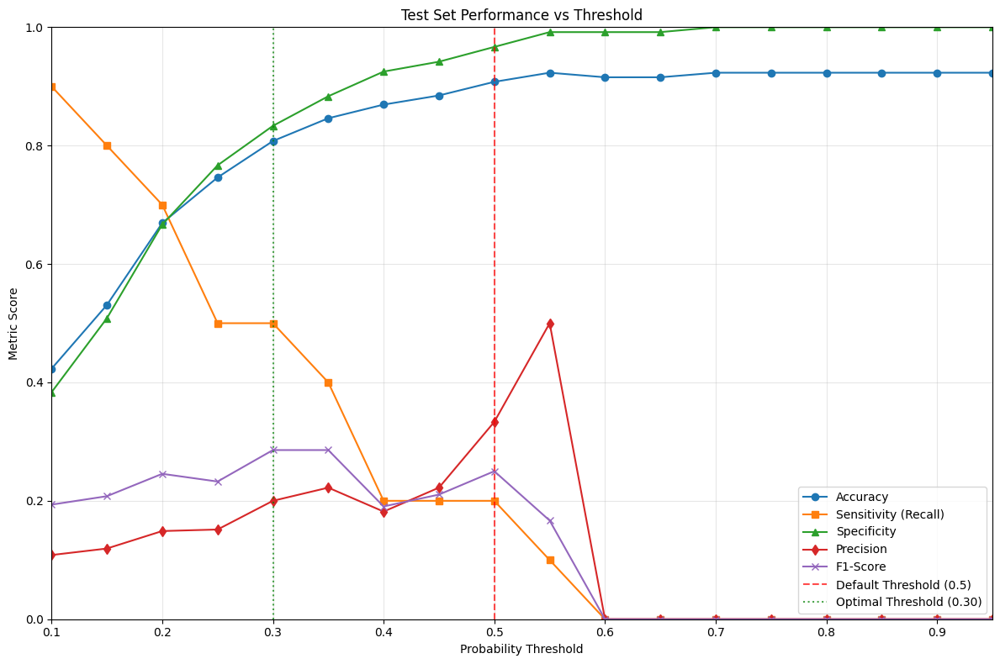


Optimal threshold based on F1-score: 0.300
F1-score at optimal threshold: 0.2857
Threshold analysis saved to: /content/drive/MyDrive/epoch_models/threshold_analysis.csv

Comprehensive Evaluation Summary:
      Dataset  Accuracy  Sensitivity_Recall  Specificity  Precision_PPV  \
0    Training    0.9179                 0.0       0.9944         0.0000   
1  Validation    0.9000                 0.0       0.9750         0.0000   
2        Test    0.9077                 0.2       0.9667         0.3333   

      NPV  F1_Score     AUC  True_Positives  True_Negatives  False_Positives  \
0  0.9227      0.00  0.7455               0             358                2   
1  0.9213      0.00  0.5550               0             117                3   
2  0.9355      0.25  0.7500               2             116                4   

   False_Negatives  
0               30  
1               10  
2                8  

Optimal Threshold: 0.300
Summary saved to: /content/drive/MyDrive/epoch_models/comprehen

In [ ]:
# Cell 12: Enhanced Evaluation with Confusion Matrix
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, precision_score, f1_score
import numpy as np

def evaluate_model_with_confusion_matrix(model, loader, dataset_name="", save_path=None):
    """
    Comprehensive evaluation function with confusion matrix and detailed metrics
    """
    model.eval()
    all_preds, all_labels = [], []
    all_probs = []  # Store probabilities for threshold analysis

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(DEVICE)
            outputs = model(images)
            probs = torch.sigmoid(outputs).cpu().numpy().flatten()
            all_probs.extend(probs)
            all_labels.extend(labels.numpy().flatten())

    # Convert to numpy arrays
    all_probs = np.array(all_probs)
    all_labels = np.array(all_labels)

    # Binary predictions with 0.5 threshold
    bin_preds = (all_probs >= 0.5).astype(int)

    # Calculate metrics
    acc = accuracy_score(all_labels, bin_preds)
    auc = roc_auc_score(all_labels, all_probs) if len(set(all_labels)) > 1 else 0.0
    recall = recall_score(all_labels, bin_preds, zero_division=0)
    precision = precision_score(all_labels, bin_preds, zero_division=0)
    f1 = f1_score(all_labels, bin_preds, zero_division=0)

    # Confusion Matrix
    cm = confusion_matrix(all_labels, bin_preds)

    # Calculate additional metrics from confusion matrix
    tn, fp, fn, tp = cm.ravel()

    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0  # Same as recall
    ppv = tp / (tp + fp) if (tp + fp) > 0 else 0  # Positive Predictive Value (Precision)
    npv = tn / (tn + fn) if (tn + fn) > 0 else 0  # Negative Predictive Value

    print(f"\n{dataset_name} Results:")
    print("=" * 60)
    print(f"Accuracy:     {acc:.4f}")
    print(f"AUC-ROC:      {auc:.4f}")
    print(f"Sensitivity (Recall): {sensitivity:.4f}")
    print(f"Specificity:  {specificity:.4f}")
    print(f"Precision (PPV):      {precision:.4f}")
    print(f"NPV:          {npv:.4f}")
    print(f"F1-Score:     {f1:.4f}")

    print(f"\nConfusion Matrix:")
    print(f"True Negatives (TN):  {tn}")
    print(f"False Positives (FP): {fp}")
    print(f"False Negatives (FN): {fn}")
    print(f"True Positives (TP):  {tp}")

    # Plot confusion matrix
    plt.figure(figsize=(10, 8))

    # Create subplot layout
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))

    # 1. Confusion Matrix (Raw Numbers)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax1,
                xticklabels=['Benign', 'Malignant'],
                yticklabels=['Benign', 'Malignant'])
    ax1.set_title(f'{dataset_name} Confusion Matrix (Counts)')
    ax1.set_xlabel('Predicted')
    ax1.set_ylabel('Actual')

    # Add text annotations for clarity
    ax1.text(0.5, 0.1, f'TN = {tn}', ha='center', va='center', transform=ax1.transAxes, fontsize=12, weight='bold')
    ax1.text(1.5, 0.1, f'FP = {fp}', ha='center', va='center', transform=ax1.transAxes, fontsize=12, weight='bold')
    ax1.text(0.5, 0.9, f'FN = {fn}', ha='center', va='center', transform=ax1.transAxes, fontsize=12, weight='bold')
    ax1.text(1.5, 0.9, f'TP = {tp}', ha='center', va='center', transform=ax1.transAxes, fontsize=12, weight='bold')

    # 2. Confusion Matrix (Normalized)
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    sns.heatmap(cm_normalized, annot=True, fmt='.3f', cmap='Blues', ax=ax2,
                xticklabels=['Benign', 'Malignant'],
                yticklabels=['Benign', 'Malignant'])
    ax2.set_title(f'{dataset_name} Confusion Matrix (Normalized)')
    ax2.set_xlabel('Predicted')
    ax2.set_ylabel('Actual')

    # 3. Metrics Bar Chart
    metrics_names = ['Accuracy', 'Sensitivity\n(Recall)', 'Specificity', 'Precision\n(PPV)', 'NPV', 'F1-Score']
    metrics_values = [acc, sensitivity, specificity, precision, npv, f1]

    bars = ax3.bar(metrics_names, metrics_values, color=['skyblue', 'lightgreen', 'lightcoral', 'gold', 'plum', 'orange'])
    ax3.set_title(f'{dataset_name} Performance Metrics')
    ax3.set_ylabel('Score')
    ax3.set_ylim(0, 1)
    ax3.grid(axis='y', alpha=0.3)

    # Add value labels on bars
    for bar, value in zip(bars, metrics_values):
        height = bar.get_height()
        ax3.text(bar.get_x() + bar.get_width()/2., height + 0.01,
                f'{value:.3f}', ha='center', va='bottom', fontweight='bold')

    # 4. Prediction Distribution
    ax4.hist(all_probs[all_labels == 0], bins=30, alpha=0.7, label='Benign', color='blue', density=True)
    ax4.hist(all_probs[all_labels == 1], bins=30, alpha=0.7, label='Malignant', color='red', density=True)
    ax4.axvline(x=0.5, color='black', linestyle='--', label='Threshold (0.5)')
    ax4.set_xlabel('Predicted Probability')
    ax4.set_ylabel('Density')
    ax4.set_title(f'{dataset_name} Prediction Probability Distribution')
    ax4.legend()
    ax4.grid(alpha=0.3)

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"\nConfusion matrix plot saved to: {save_path}")

    plt.show()

    # Classification Report
    print(f"\nClassification Report:")
    print(classification_report(all_labels, bin_preds,
                              target_names=['Benign', 'Malignant'],
                              digits=4))

    # Return comprehensive metrics
    metrics_dict = {
        'accuracy': acc,
        'auc': auc,
        'sensitivity_recall': sensitivity,
        'specificity': specificity,
        'precision_ppv': precision,
        'npv': npv,
        'f1_score': f1,
        'true_negatives': tn,
        'false_positives': fp,
        'false_negatives': fn,
        'true_positives': tp,
        'confusion_matrix': cm,
        'probabilities': all_probs,
        'true_labels': all_labels,
        'predictions': bin_preds
    }

    return metrics_dict

def analyze_threshold_performance(model, loader, dataset_name=""):
    """
    Analyze model performance across different probability thresholds
    """
    model.eval()
    all_probs, all_labels = [], []

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(DEVICE)
            outputs = model(images)
            probs = torch.sigmoid(outputs).cpu().numpy().flatten()
            all_probs.extend(probs)
            all_labels.extend(labels.numpy().flatten())

    all_probs = np.array(all_probs)
    all_labels = np.array(all_labels)

    thresholds = np.arange(0.1, 1.0, 0.05)
    threshold_results = []

    for threshold in thresholds:
        preds = (all_probs >= threshold).astype(int)

        acc = accuracy_score(all_labels, preds)
        recall = recall_score(all_labels, preds, zero_division=0)
        precision = precision_score(all_labels, preds, zero_division=0)
        f1 = f1_score(all_labels, preds, zero_division=0)

        # Calculate specificity
        cm = confusion_matrix(all_labels, preds)
        if cm.shape == (2, 2):
            tn, fp, fn, tp = cm.ravel()
            specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
        else:
            specificity = 0

        threshold_results.append({
            'threshold': threshold,
            'accuracy': acc,
            'sensitivity': recall,
            'specificity': specificity,
            'precision': precision,
            'f1_score': f1
        })

    threshold_df = pd.DataFrame(threshold_results)

    # Plot threshold analysis
    plt.figure(figsize=(12, 8))
    plt.plot(threshold_df['threshold'], threshold_df['accuracy'], 'o-', label='Accuracy')
    plt.plot(threshold_df['threshold'], threshold_df['sensitivity'], 's-', label='Sensitivity (Recall)')
    plt.plot(threshold_df['threshold'], threshold_df['specificity'], '^-', label='Specificity')
    plt.plot(threshold_df['threshold'], threshold_df['precision'], 'd-', label='Precision')
    plt.plot(threshold_df['threshold'], threshold_df['f1_score'], 'x-', label='F1-Score')

    plt.axvline(x=0.5, color='red', linestyle='--', alpha=0.7, label='Default Threshold (0.5)')

    plt.xlabel('Probability Threshold')
    plt.ylabel('Metric Score')
    plt.title(f'{dataset_name} Performance vs Threshold')
    plt.legend()
    plt.grid(alpha=0.3)
    plt.xlim(0.1, 0.95)
    plt.ylim(0, 1)

    # Find optimal threshold based on F1 score
    optimal_idx = threshold_df['f1_score'].idxmax()
    optimal_threshold = threshold_df.loc[optimal_idx, 'threshold']
    optimal_f1 = threshold_df.loc[optimal_idx, 'f1_score']

    plt.axvline(x=optimal_threshold, color='green', linestyle=':', alpha=0.7,
                label=f'Optimal Threshold ({optimal_threshold:.2f})')
    plt.legend()

    plt.tight_layout()
    plt.show()

    print(f"\nOptimal threshold based on F1-score: {optimal_threshold:.3f}")
    print(f"F1-score at optimal threshold: {optimal_f1:.4f}")

    return threshold_df, optimal_threshold

# Cell 13: Apply Enhanced Evaluation to Your Models

# Evaluate the best model with detailed confusion matrix
print("Evaluating Best Model with Confusion Matrix Analysis")
print("=" * 60)

# Create save path for confusion matrix plots
cm_save_dir = os.path.join(MODEL_SAVE_DIR, 'confusion_matrices')
os.makedirs(cm_save_dir, exist_ok=True)

# Evaluate on all datasets with the best model
train_metrics = evaluate_model_with_confusion_matrix(
    best_model, train_loader, "Training Set",
    save_path=os.path.join(cm_save_dir, f'train_confusion_matrix_epoch_{best_epoch_num}.png')
)

val_metrics = evaluate_model_with_confusion_matrix(
    best_model, val_loader, "Validation Set",
    save_path=os.path.join(cm_save_dir, f'val_confusion_matrix_epoch_{best_epoch_num}.png')
)

test_metrics = evaluate_model_with_confusion_matrix(
    best_model, test_loader, "Test Set",
    save_path=os.path.join(cm_save_dir, f'test_confusion_matrix_epoch_{best_epoch_num}.png')
)

# Analyze threshold performance on test set
print("\n" + "="*60)
print("Threshold Analysis on Test Set")
print("="*60)
threshold_df, optimal_threshold = analyze_threshold_performance(best_model, test_loader, "Test Set")

# Save threshold analysis
threshold_csv_path = os.path.join(MODEL_SAVE_DIR, 'threshold_analysis.csv')
threshold_df.to_csv(threshold_csv_path, index=False)
print(f"Threshold analysis saved to: {threshold_csv_path}")

# Cell 14: Comprehensive Results Summary
def create_comprehensive_summary(train_metrics, val_metrics, test_metrics, optimal_threshold):
    """
    Create a comprehensive summary of all evaluation metrics
    """
    summary_data = {
        'Dataset': ['Training', 'Validation', 'Test'],
        'Accuracy': [train_metrics['accuracy'], val_metrics['accuracy'], test_metrics['accuracy']],
        'Sensitivity_Recall': [train_metrics['sensitivity_recall'], val_metrics['sensitivity_recall'], test_metrics['sensitivity_recall']],
        'Specificity': [train_metrics['specificity'], val_metrics['specificity'], test_metrics['specificity']],
        'Precision_PPV': [train_metrics['precision_ppv'], val_metrics['precision_ppv'], test_metrics['precision_ppv']],
        'NPV': [train_metrics['npv'], val_metrics['npv'], test_metrics['npv']],
        'F1_Score': [train_metrics['f1_score'], val_metrics['f1_score'], test_metrics['f1_score']],
        'AUC': [train_metrics['auc'], val_metrics['auc'], test_metrics['auc']],
        'True_Positives': [train_metrics['true_positives'], val_metrics['true_positives'], test_metrics['true_positives']],
        'True_Negatives': [train_metrics['true_negatives'], val_metrics['true_negatives'], test_metrics['true_negatives']],
        'False_Positives': [train_metrics['false_positives'], val_metrics['false_positives'], test_metrics['false_positives']],
        'False_Negatives': [train_metrics['false_negatives'], val_metrics['false_negatives'], test_metrics['false_negatives']]
    }

    summary_df = pd.DataFrame(summary_data)

    # Save comprehensive summary
    summary_path = os.path.join(MODEL_SAVE_DIR, 'comprehensive_evaluation_summary.csv')
    summary_df.to_csv(summary_path, index=False)

    print(f"\nComprehensive Evaluation Summary:")
    print("=" * 100)
    print(summary_df.round(4))
    print(f"\nOptimal Threshold: {optimal_threshold:.3f}")
    print(f"Summary saved to: {summary_path}")

    return summary_df

# Create comprehensive summary
summary_df = create_comprehensive_summary(train_metrics, val_metrics, test_metrics, optimal_threshold)

print(f"\nAll evaluation results saved in: {MODEL_SAVE_DIR}")
print("Enhanced evaluation with confusion matrices complete!")

Starting comprehensive confusion matrix analysis for all epochs...
Starting Confusion Matrix Analysis for All Epoch Models

Analyzing Epoch 1/15
--------------------------------------------------
Loaded pretrained weights for efficientnet-b0
Successfully loaded model from epoch 1
Confusion matrix for Epoch 1 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_1_train_confusion_matrix.png


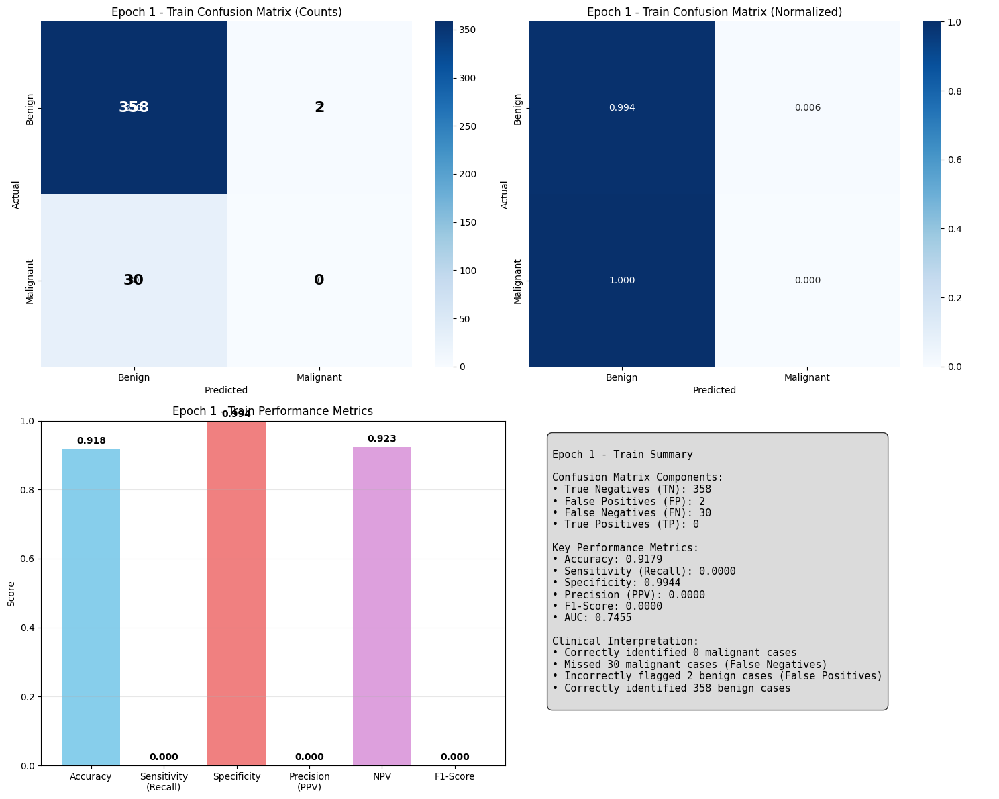

Confusion matrix for Epoch 1 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_1_validation_confusion_matrix.png


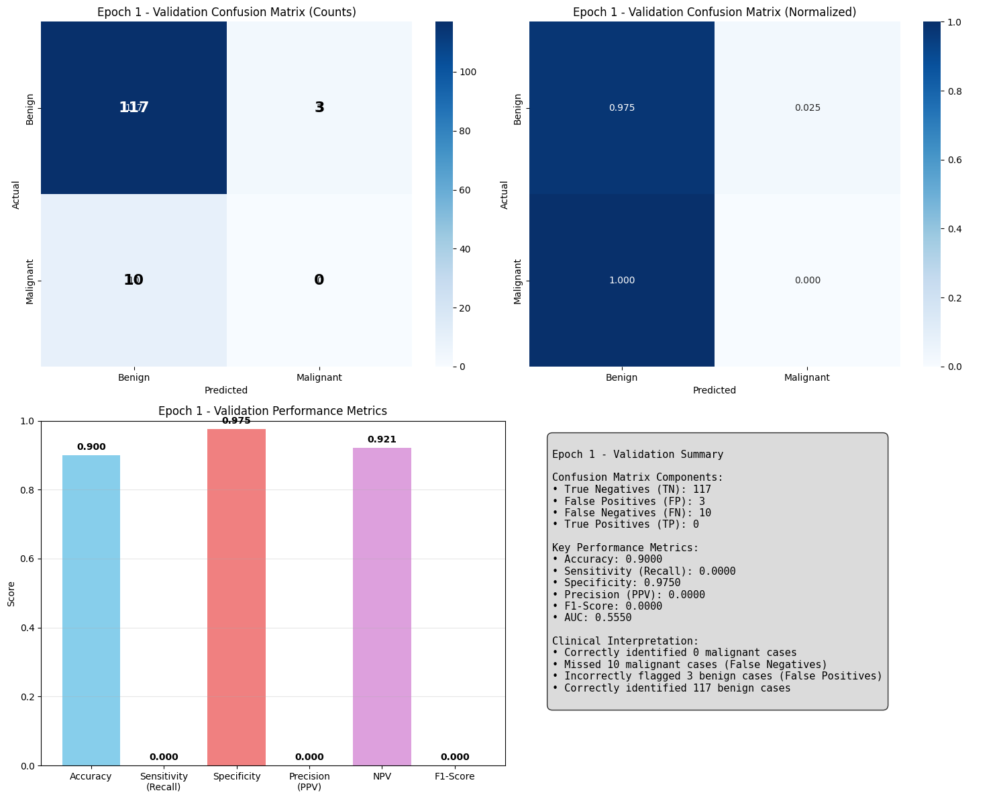

Confusion matrix for Epoch 1 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_1_test_confusion_matrix.png


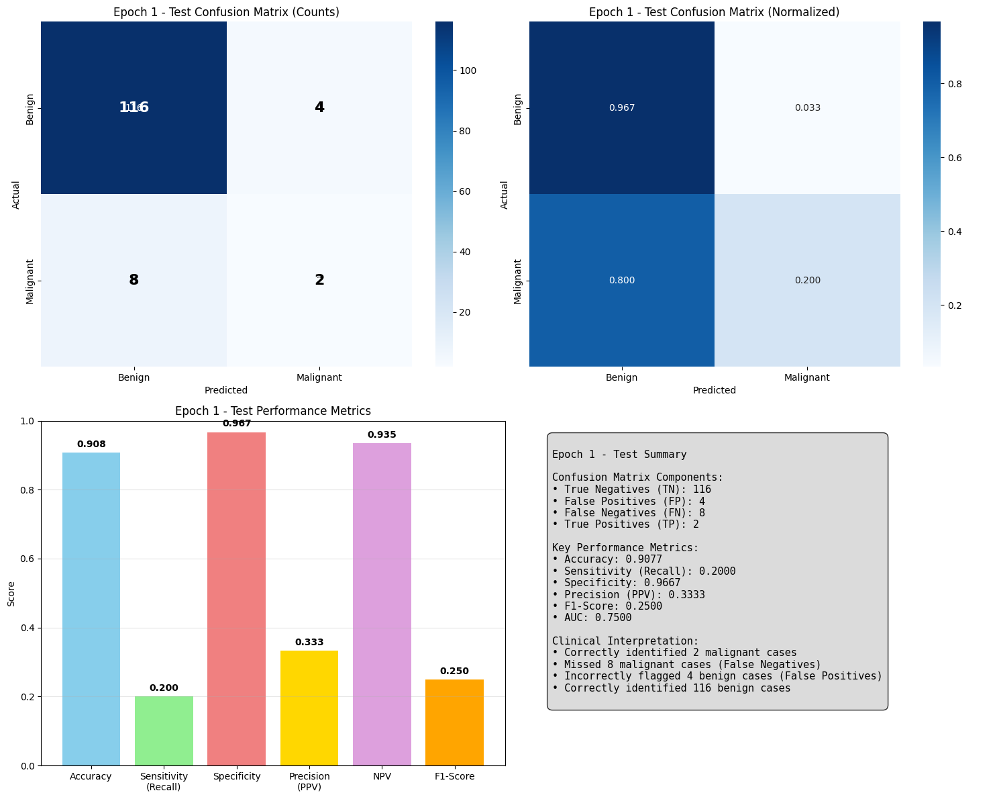

Epoch 1 Test Results:
  Accuracy: 0.9077
  Sensitivity: 0.2000
  Specificity: 0.9667
  F1-Score: 0.2500
  TP: 2, TN: 116
  FP: 4, FN: 8

Analyzing Epoch 2/15
--------------------------------------------------
Loaded pretrained weights for efficientnet-b0
Successfully loaded model from epoch 2
Confusion matrix for Epoch 2 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_2_train_confusion_matrix.png


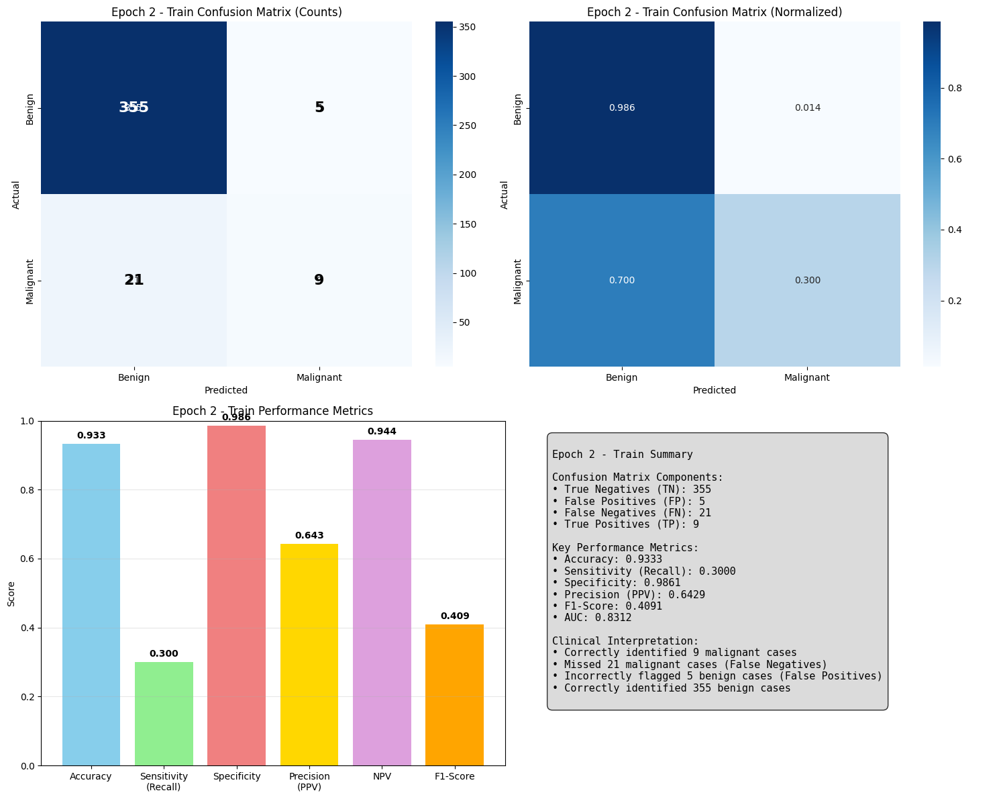

Confusion matrix for Epoch 2 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_2_validation_confusion_matrix.png


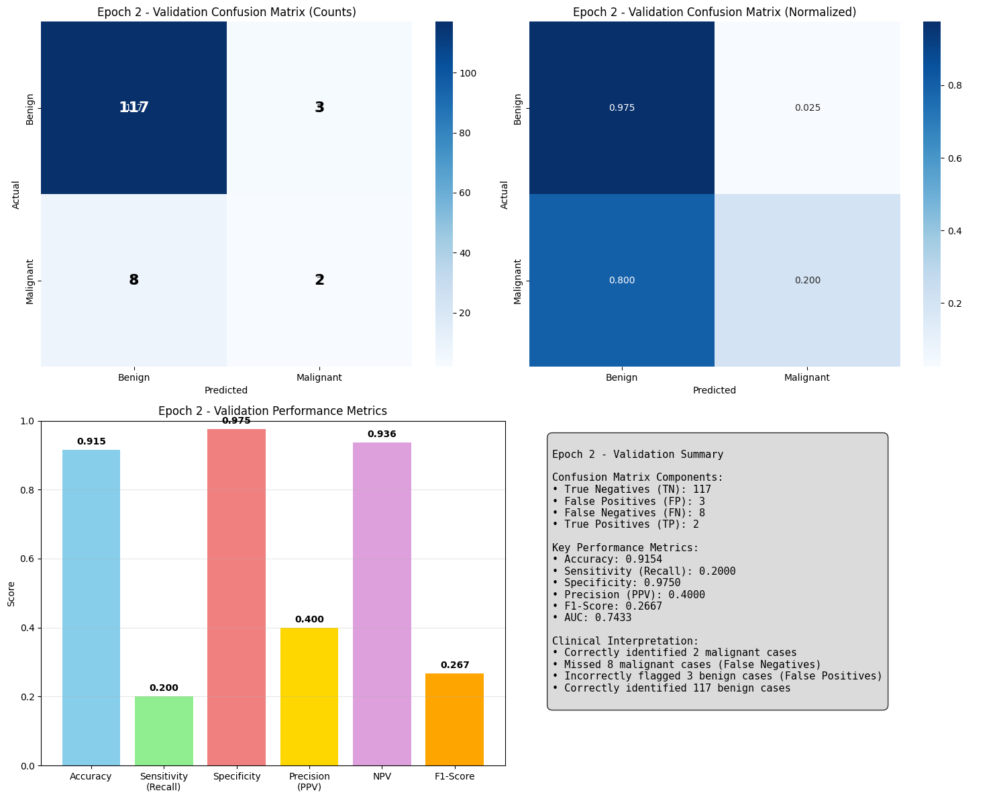

Confusion matrix for Epoch 2 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_2_test_confusion_matrix.png


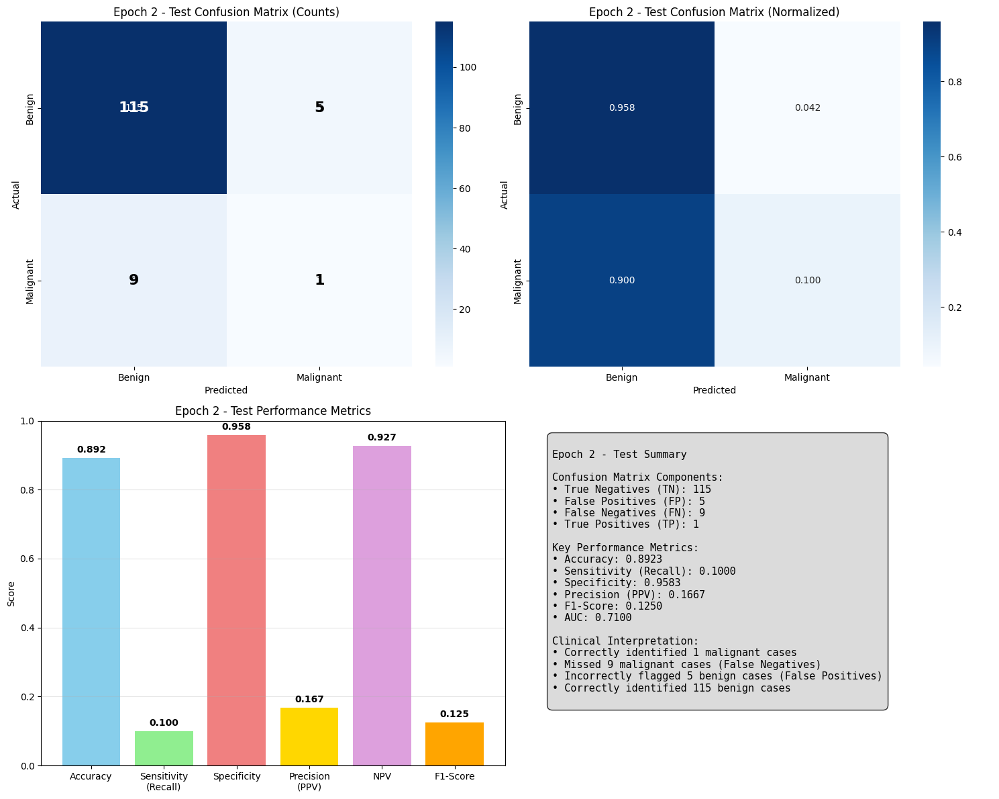

Epoch 2 Test Results:
  Accuracy: 0.8923
  Sensitivity: 0.1000
  Specificity: 0.9583
  F1-Score: 0.1250
  TP: 1, TN: 115
  FP: 5, FN: 9

Analyzing Epoch 3/15
--------------------------------------------------
Loaded pretrained weights for efficientnet-b0
Successfully loaded model from epoch 3
Confusion matrix for Epoch 3 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_3_train_confusion_matrix.png


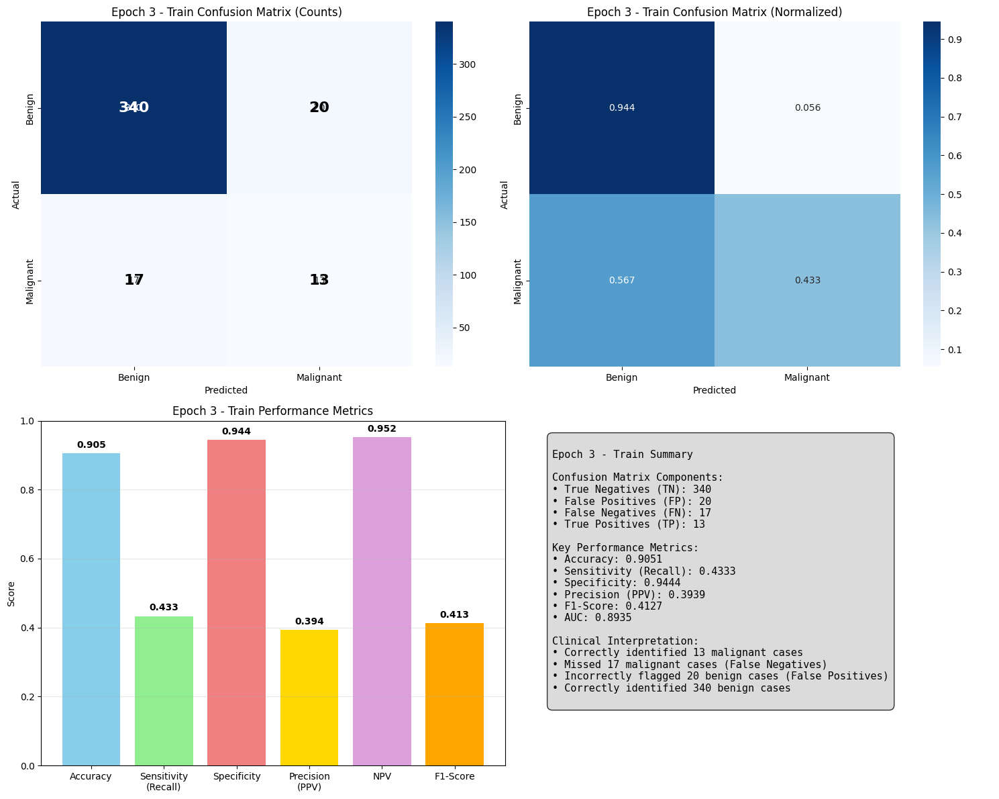

Confusion matrix for Epoch 3 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_3_validation_confusion_matrix.png


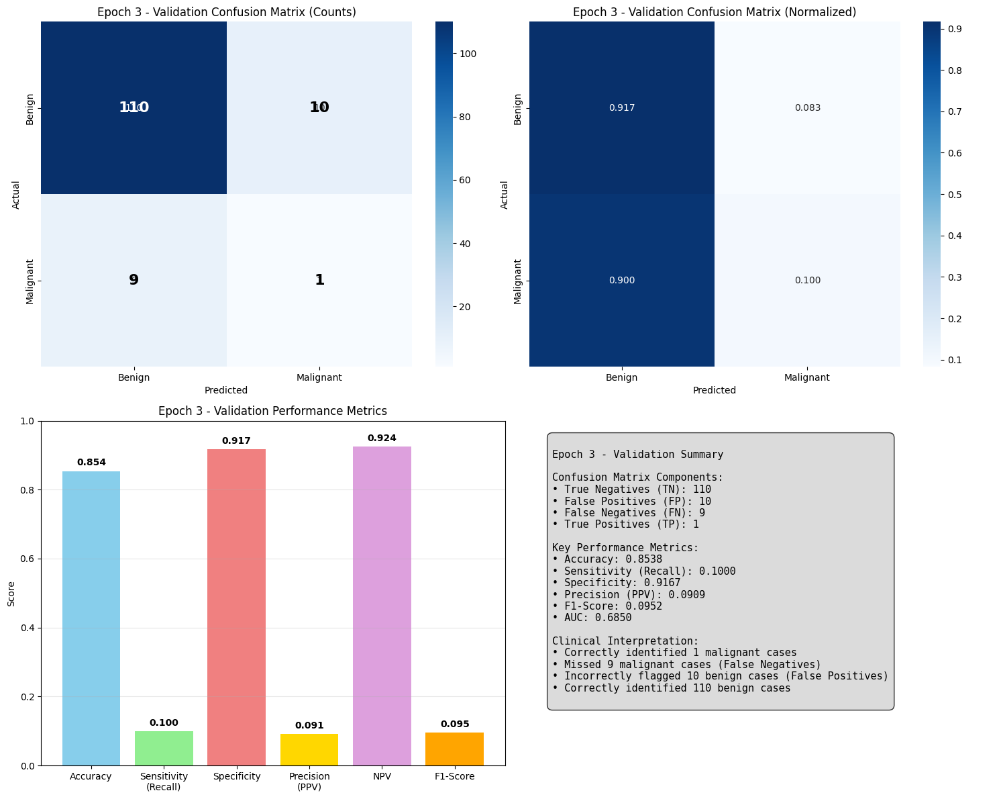

Confusion matrix for Epoch 3 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_3_test_confusion_matrix.png


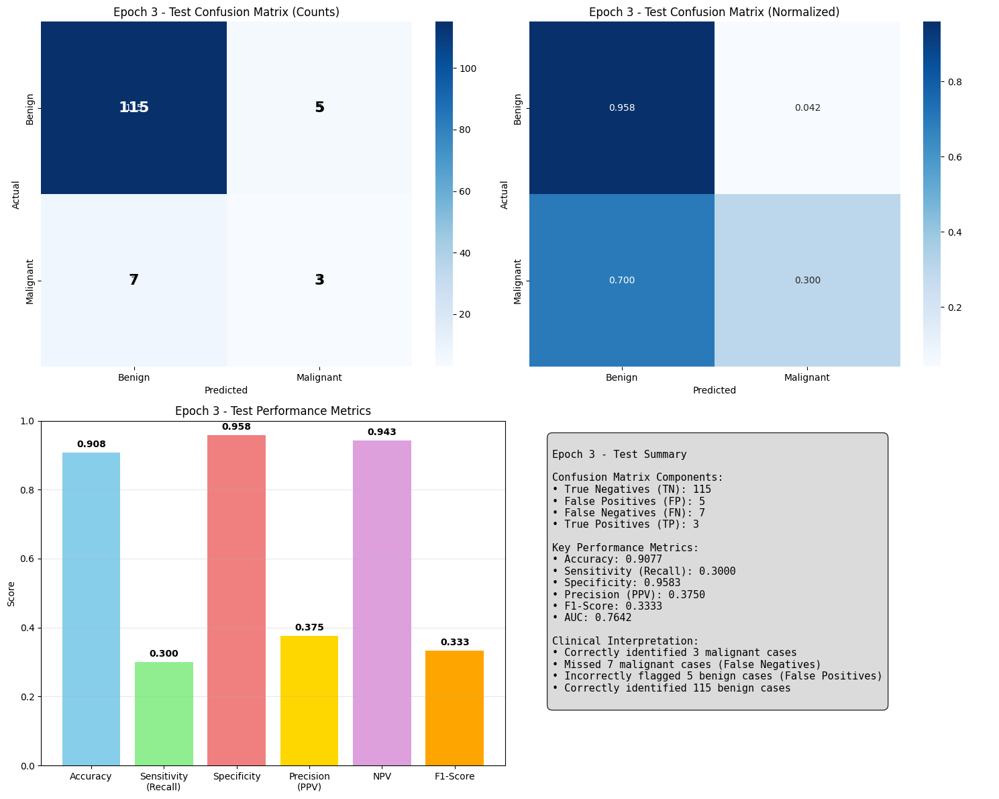

Epoch 3 Test Results:
  Accuracy: 0.9077
  Sensitivity: 0.3000
  Specificity: 0.9583
  F1-Score: 0.3333
  TP: 3, TN: 115
  FP: 5, FN: 7

Analyzing Epoch 4/15
--------------------------------------------------
Loaded pretrained weights for efficientnet-b0
Successfully loaded model from epoch 4
Confusion matrix for Epoch 4 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_4_train_confusion_matrix.png


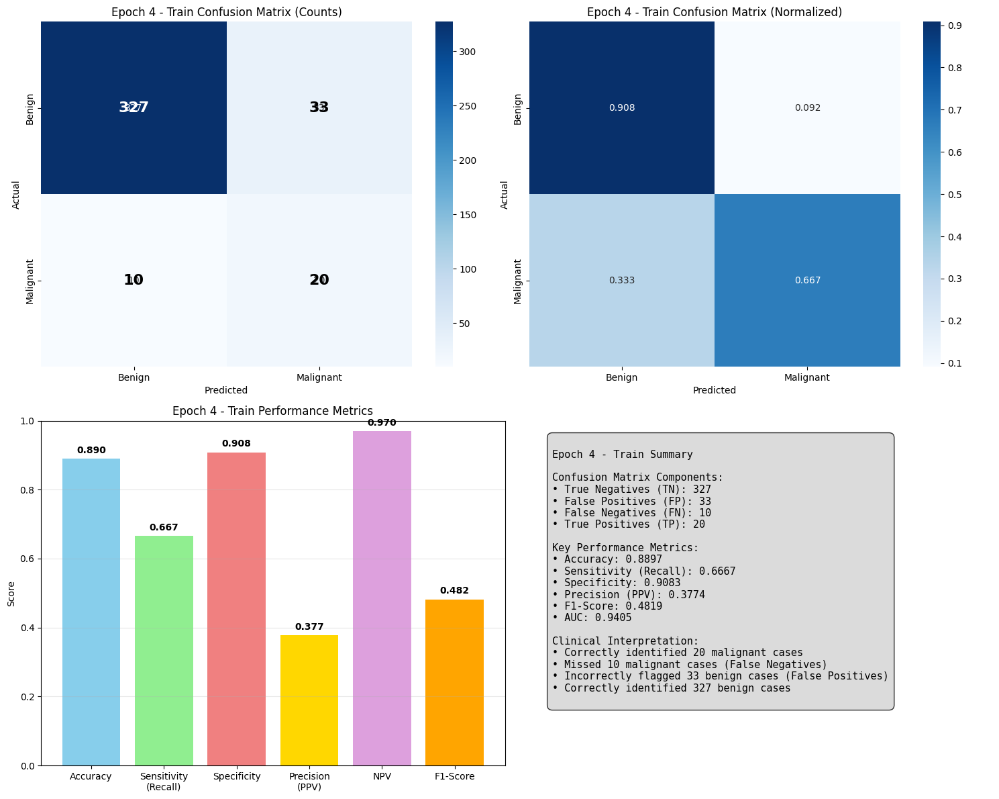

Confusion matrix for Epoch 4 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_4_validation_confusion_matrix.png


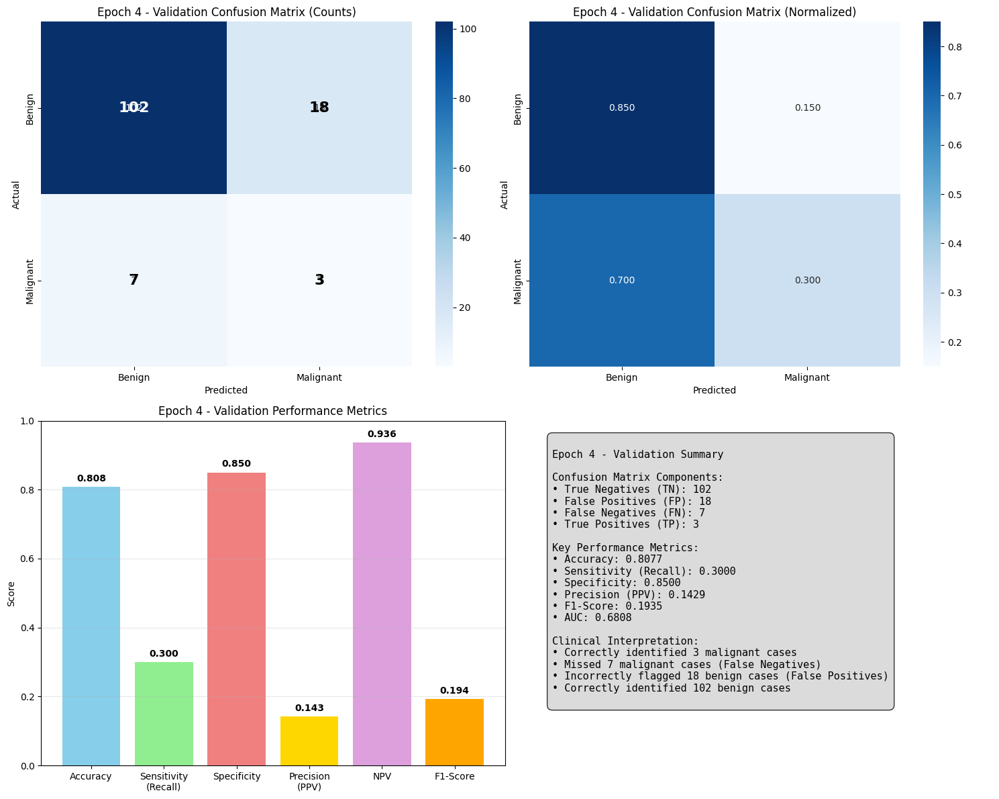

Confusion matrix for Epoch 4 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_4_test_confusion_matrix.png


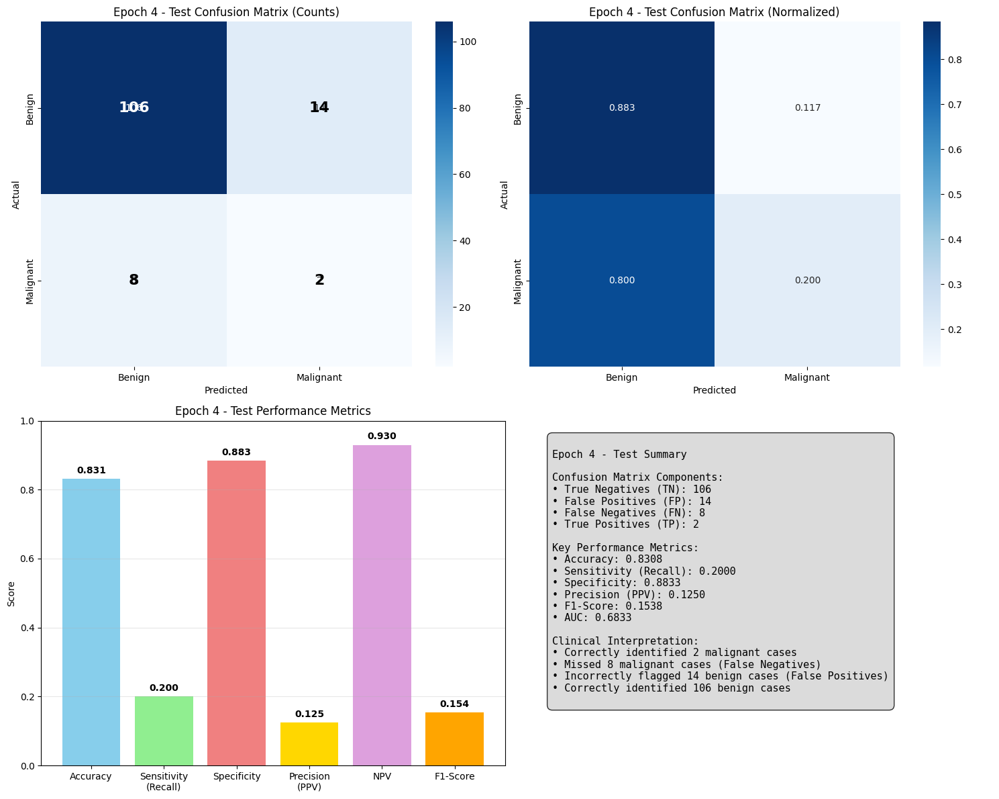

Epoch 4 Test Results:
  Accuracy: 0.8308
  Sensitivity: 0.2000
  Specificity: 0.8833
  F1-Score: 0.1538
  TP: 2, TN: 106
  FP: 14, FN: 8

Analyzing Epoch 5/15
--------------------------------------------------
Loaded pretrained weights for efficientnet-b0
Successfully loaded model from epoch 5
Confusion matrix for Epoch 5 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_5_train_confusion_matrix.png


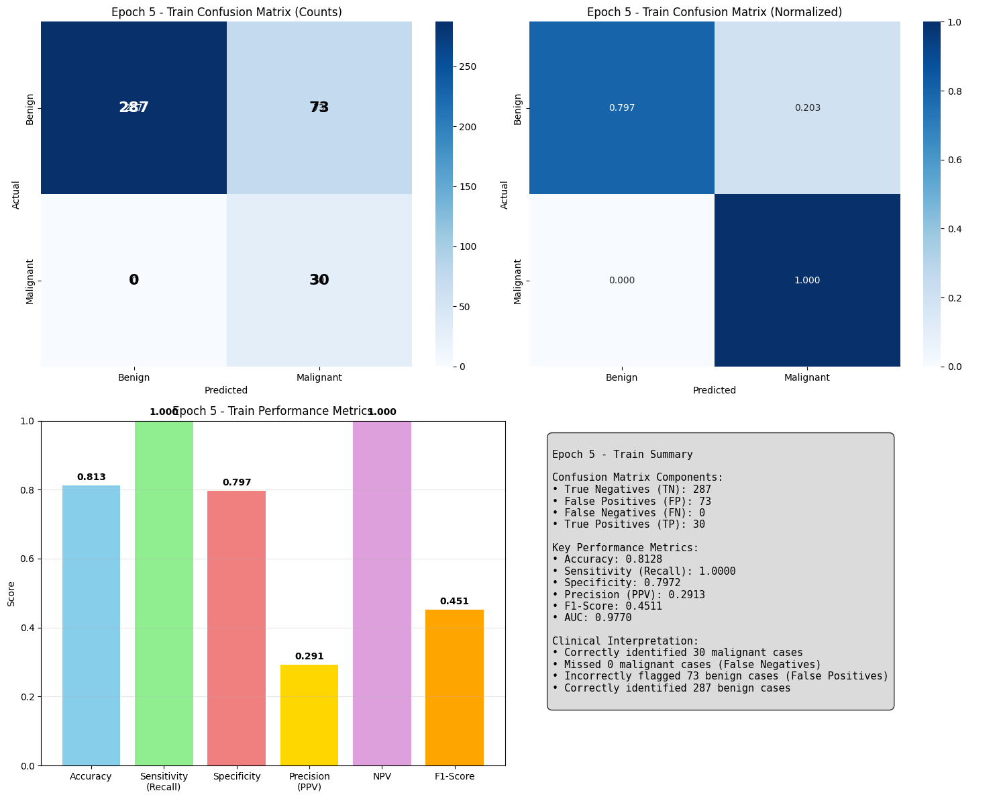

Confusion matrix for Epoch 5 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_5_validation_confusion_matrix.png


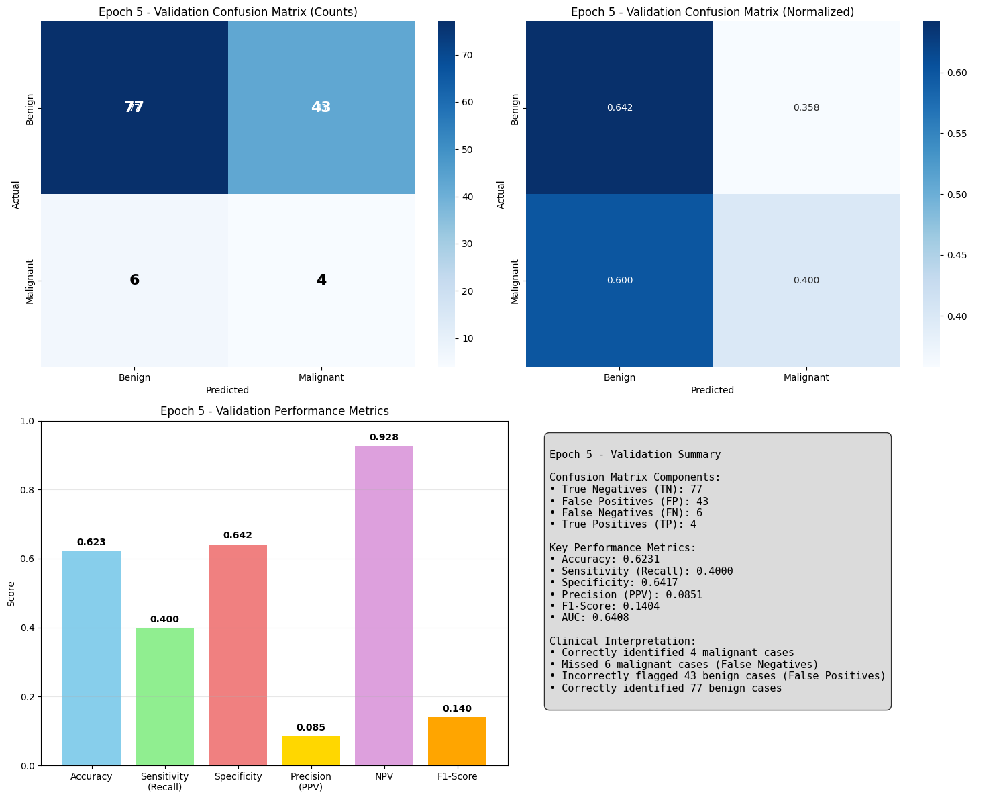

Confusion matrix for Epoch 5 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_5_test_confusion_matrix.png


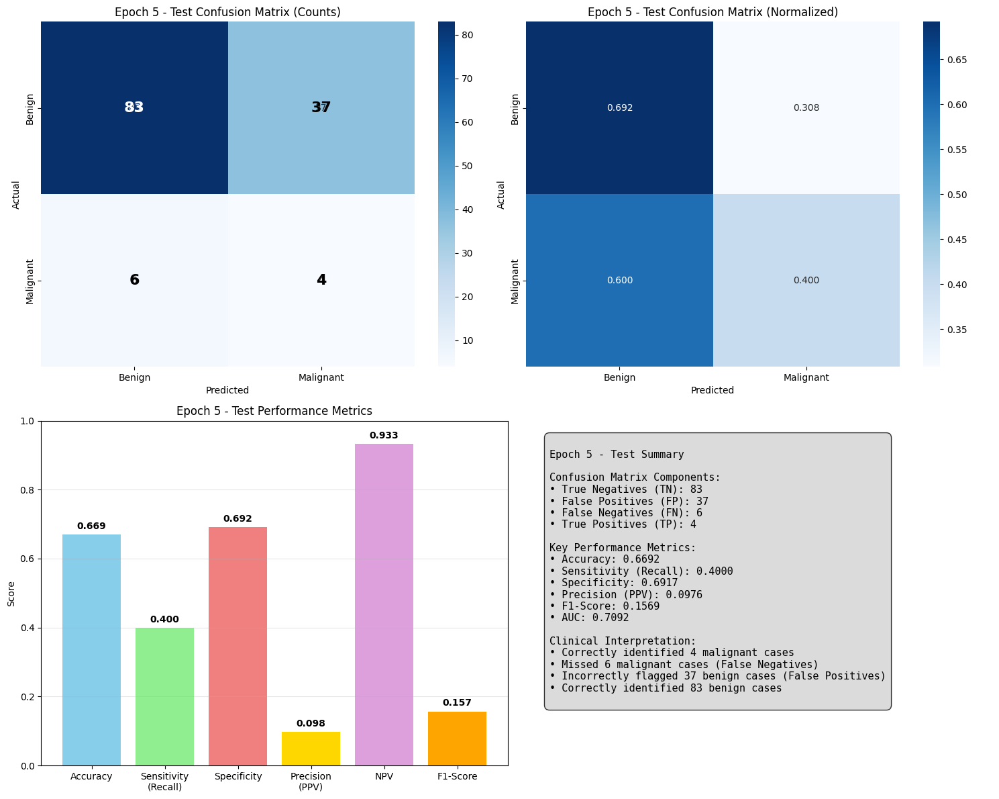

Epoch 5 Test Results:
  Accuracy: 0.6692
  Sensitivity: 0.4000
  Specificity: 0.6917
  F1-Score: 0.1569
  TP: 4, TN: 83
  FP: 37, FN: 6

Analyzing Epoch 6/15
--------------------------------------------------
Loaded pretrained weights for efficientnet-b0
Successfully loaded model from epoch 6
Confusion matrix for Epoch 6 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_6_train_confusion_matrix.png


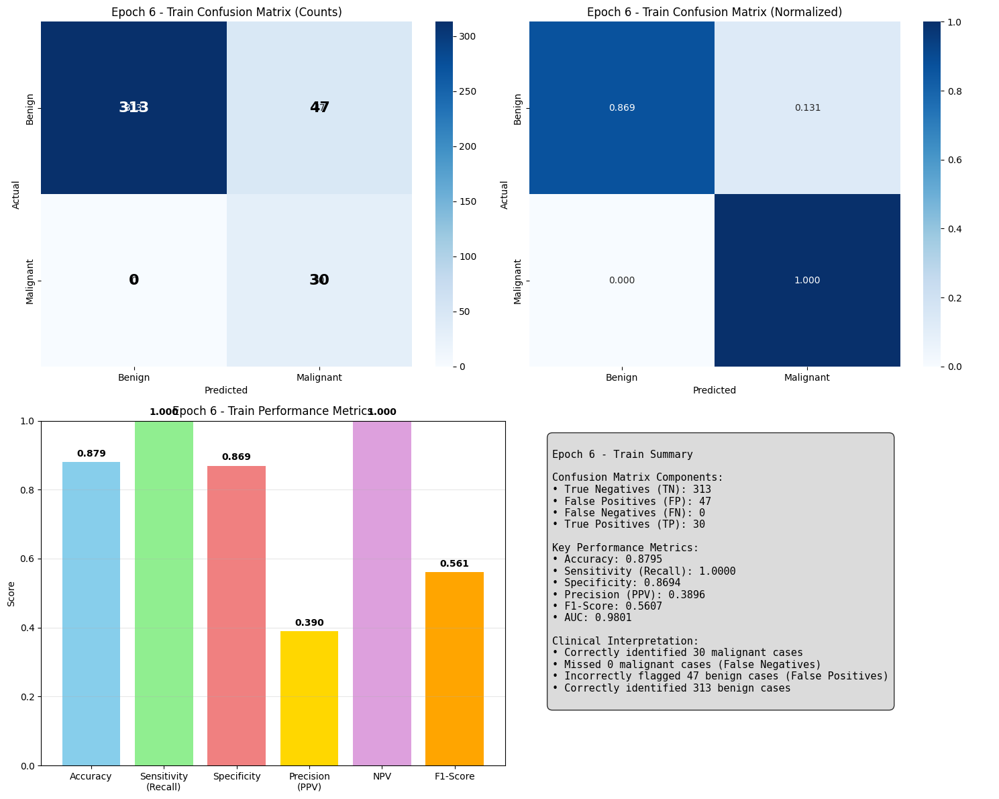

Confusion matrix for Epoch 6 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_6_validation_confusion_matrix.png


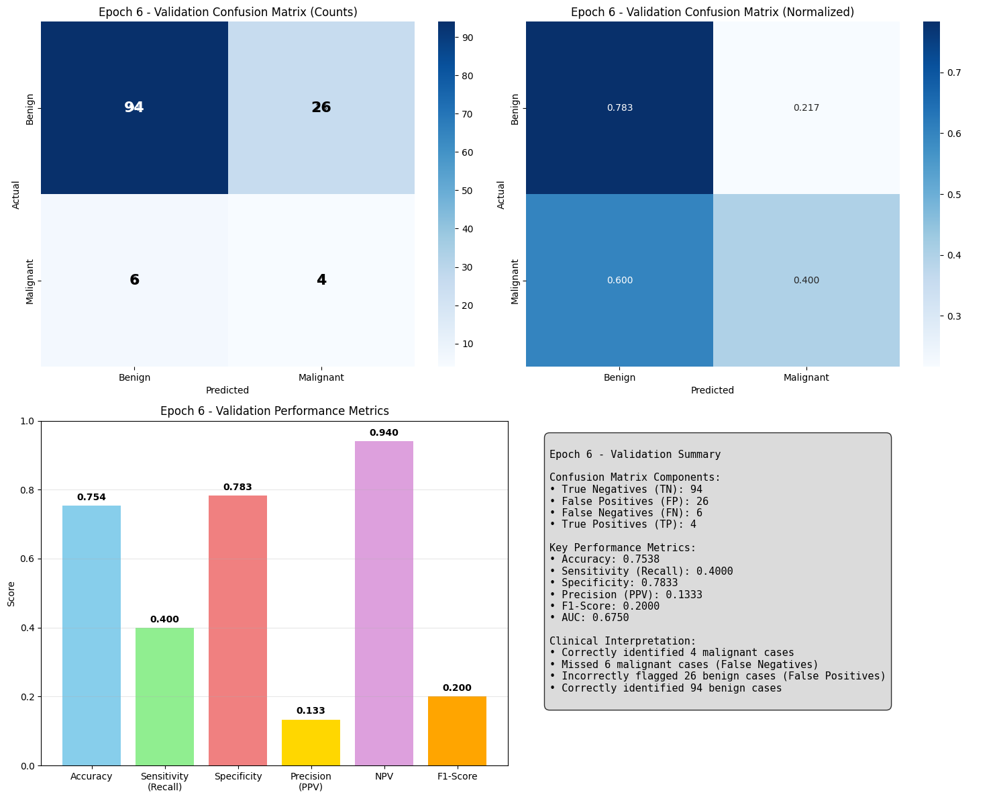

Confusion matrix for Epoch 6 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_6_test_confusion_matrix.png


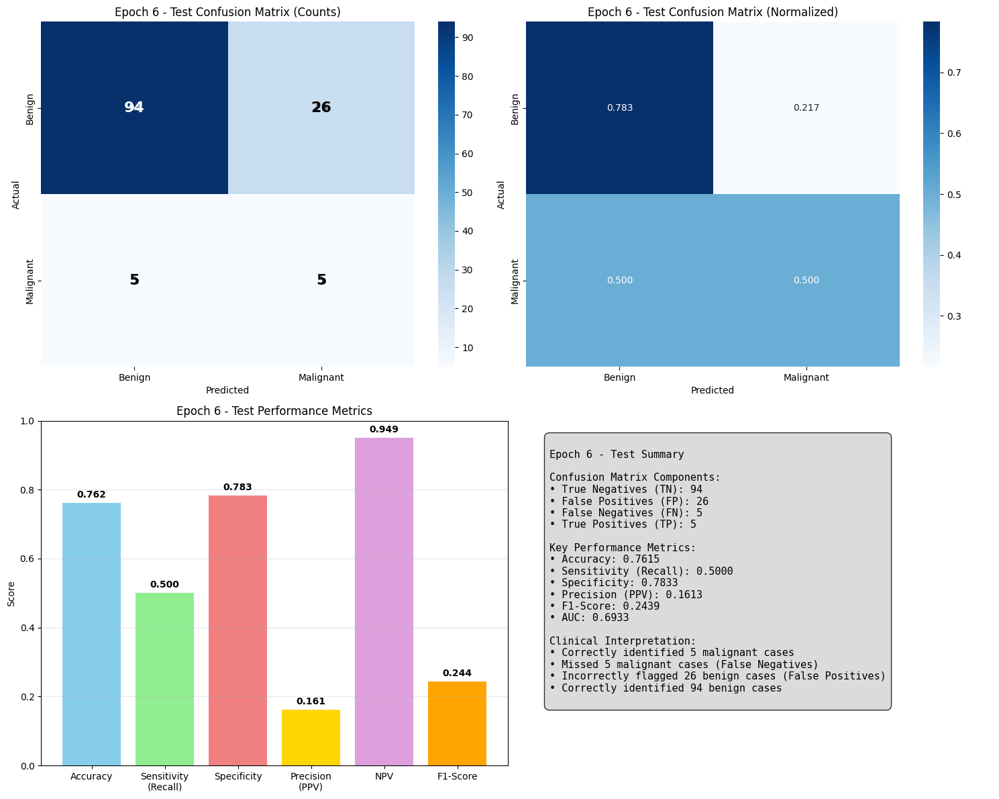

Epoch 6 Test Results:
  Accuracy: 0.7615
  Sensitivity: 0.5000
  Specificity: 0.7833
  F1-Score: 0.2439
  TP: 5, TN: 94
  FP: 26, FN: 5

Analyzing Epoch 7/15
--------------------------------------------------
Loaded pretrained weights for efficientnet-b0
Successfully loaded model from epoch 7
Confusion matrix for Epoch 7 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_7_train_confusion_matrix.png


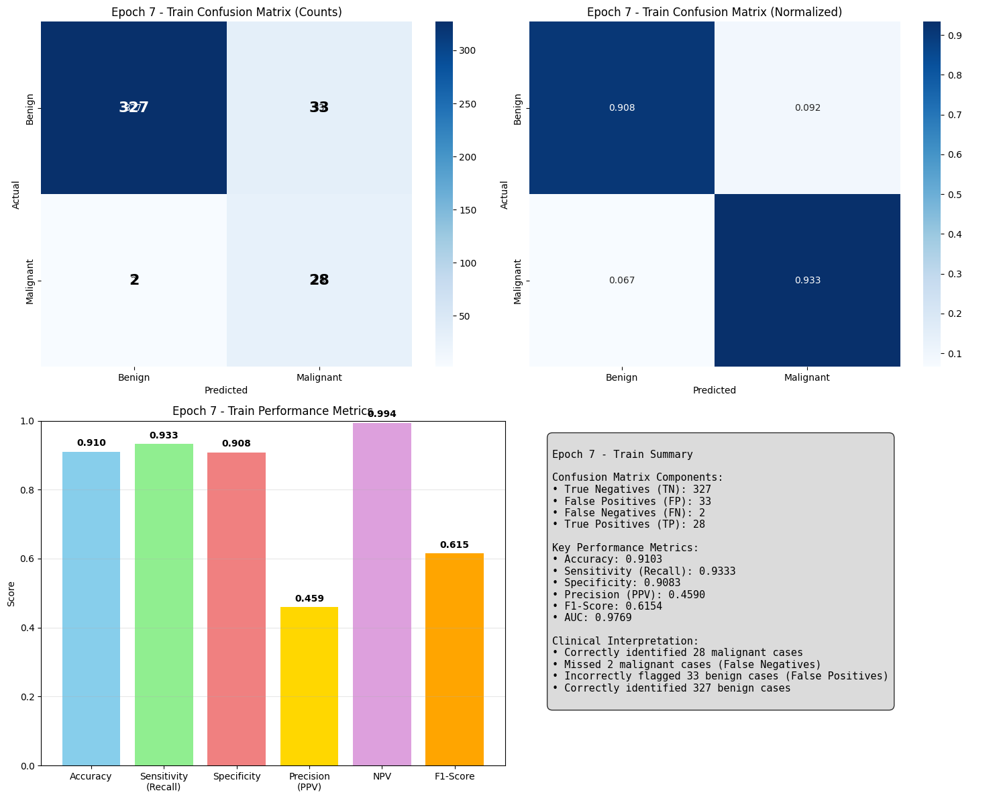

Confusion matrix for Epoch 7 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_7_validation_confusion_matrix.png


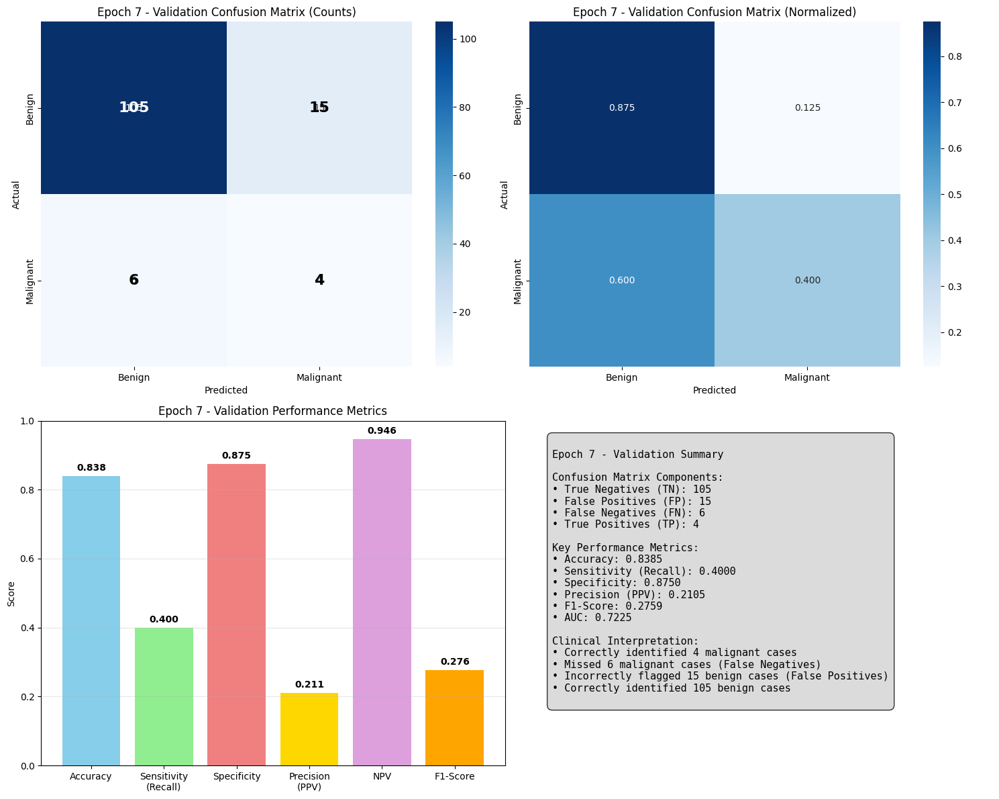

Confusion matrix for Epoch 7 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_7_test_confusion_matrix.png


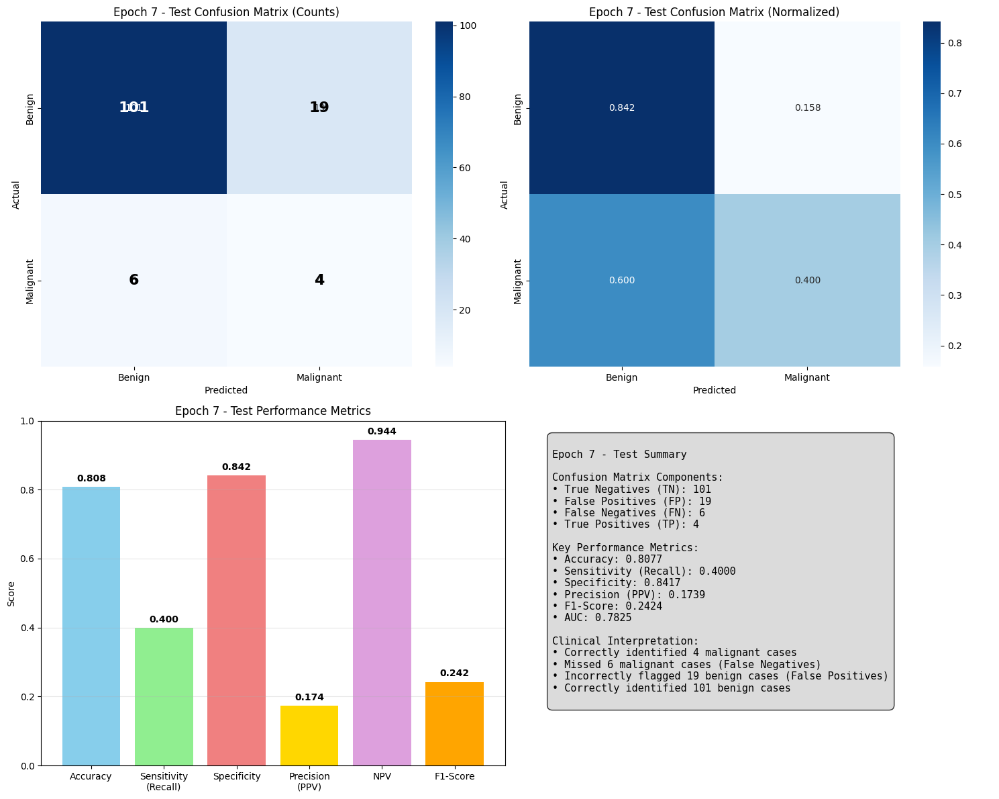

Epoch 7 Test Results:
  Accuracy: 0.8077
  Sensitivity: 0.4000
  Specificity: 0.8417
  F1-Score: 0.2424
  TP: 4, TN: 101
  FP: 19, FN: 6

Analyzing Epoch 8/15
--------------------------------------------------
Loaded pretrained weights for efficientnet-b0
Successfully loaded model from epoch 8
Confusion matrix for Epoch 8 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_8_train_confusion_matrix.png


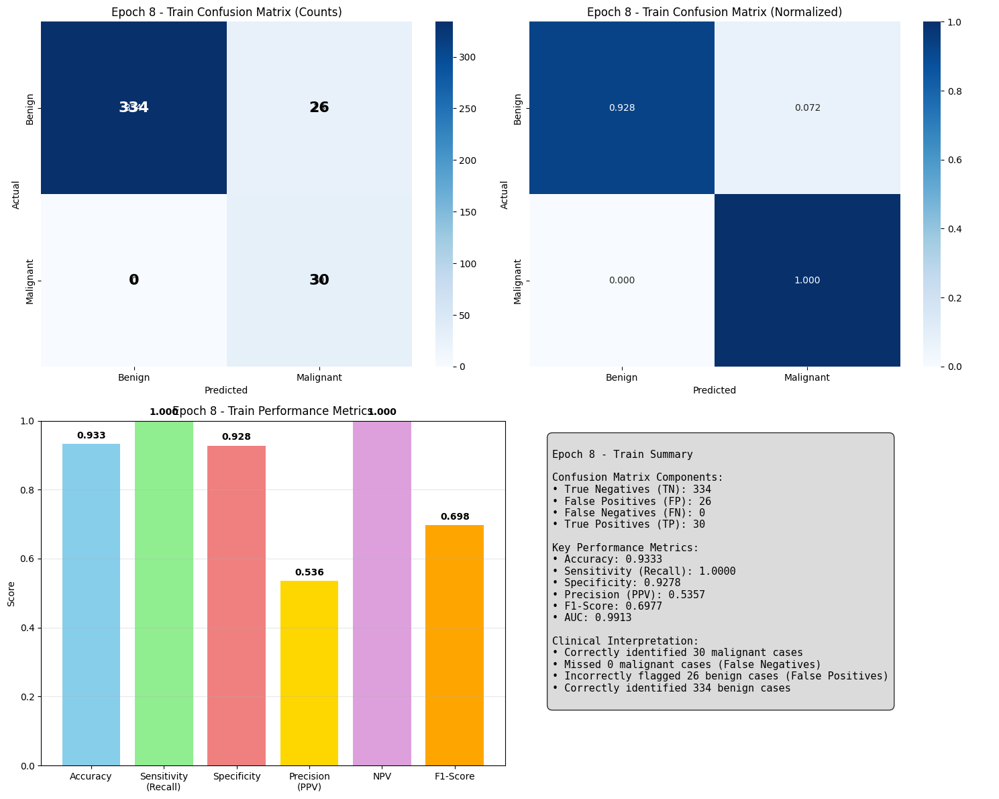

Confusion matrix for Epoch 8 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_8_validation_confusion_matrix.png


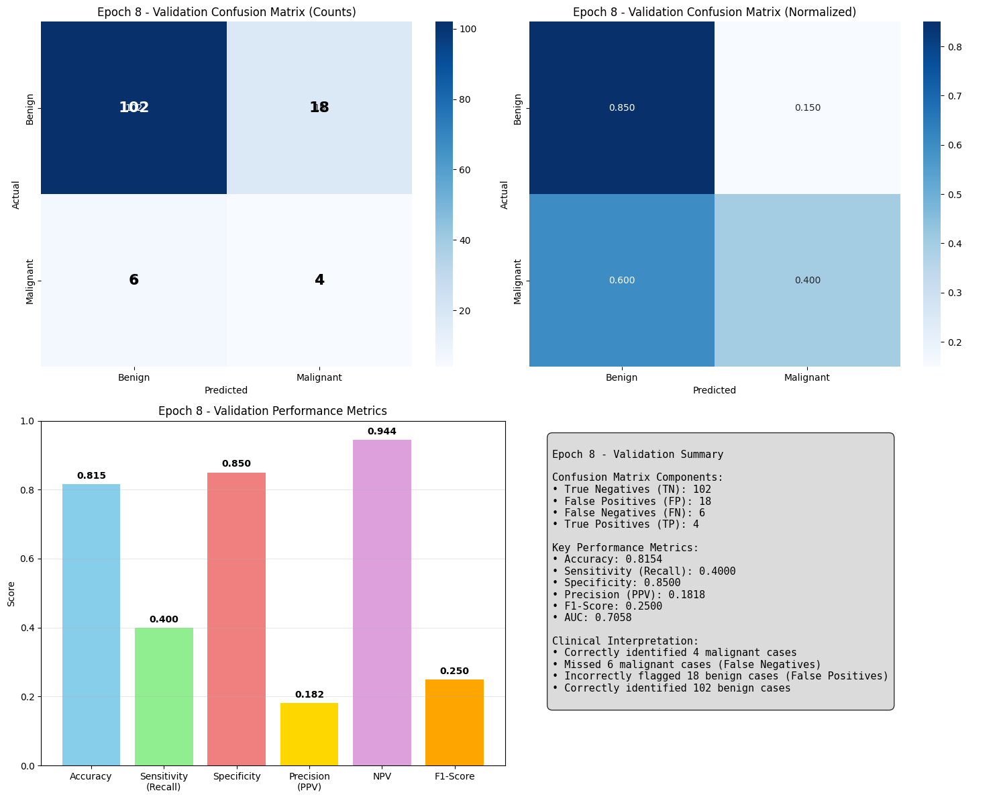

Confusion matrix for Epoch 8 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_8_test_confusion_matrix.png


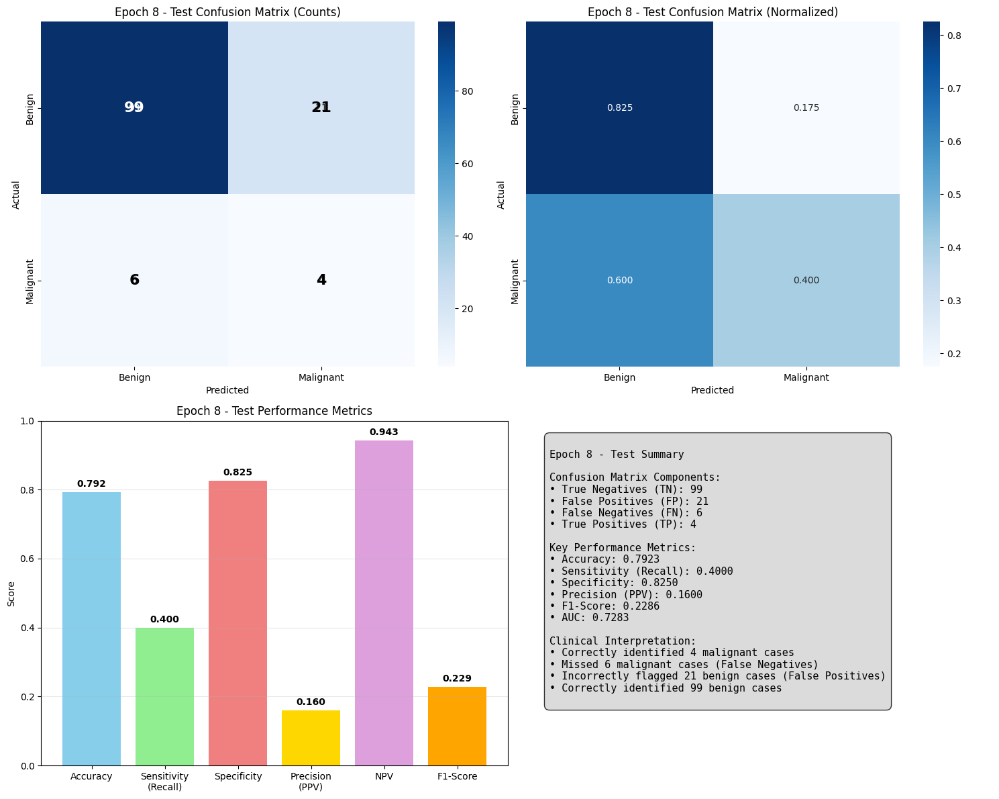

Epoch 8 Test Results:
  Accuracy: 0.7923
  Sensitivity: 0.4000
  Specificity: 0.8250
  F1-Score: 0.2286
  TP: 4, TN: 99
  FP: 21, FN: 6

Analyzing Epoch 9/15
--------------------------------------------------
Loaded pretrained weights for efficientnet-b0
Successfully loaded model from epoch 9
Confusion matrix for Epoch 9 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_9_train_confusion_matrix.png


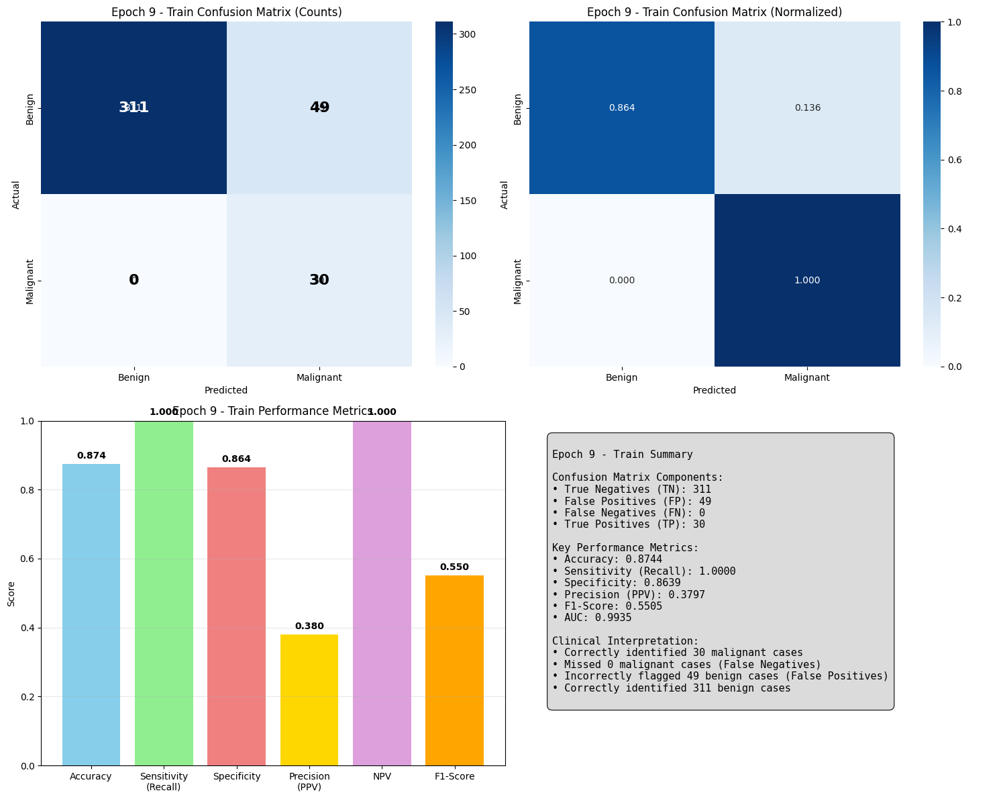

Confusion matrix for Epoch 9 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_9_validation_confusion_matrix.png


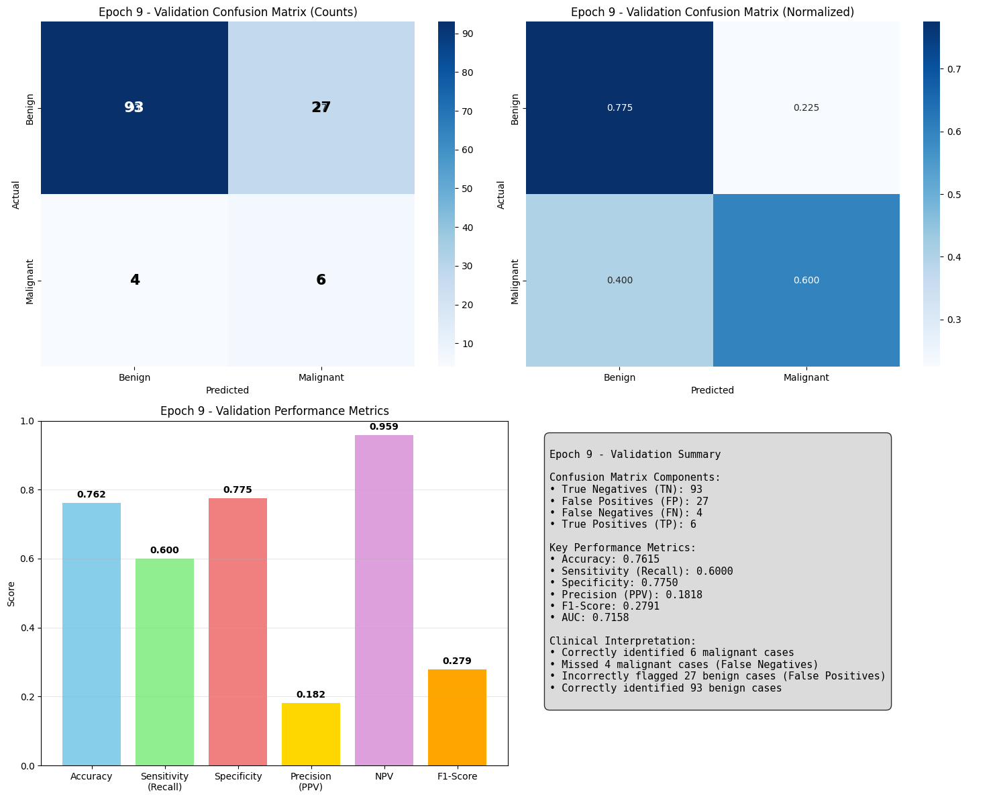

Confusion matrix for Epoch 9 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_9_test_confusion_matrix.png


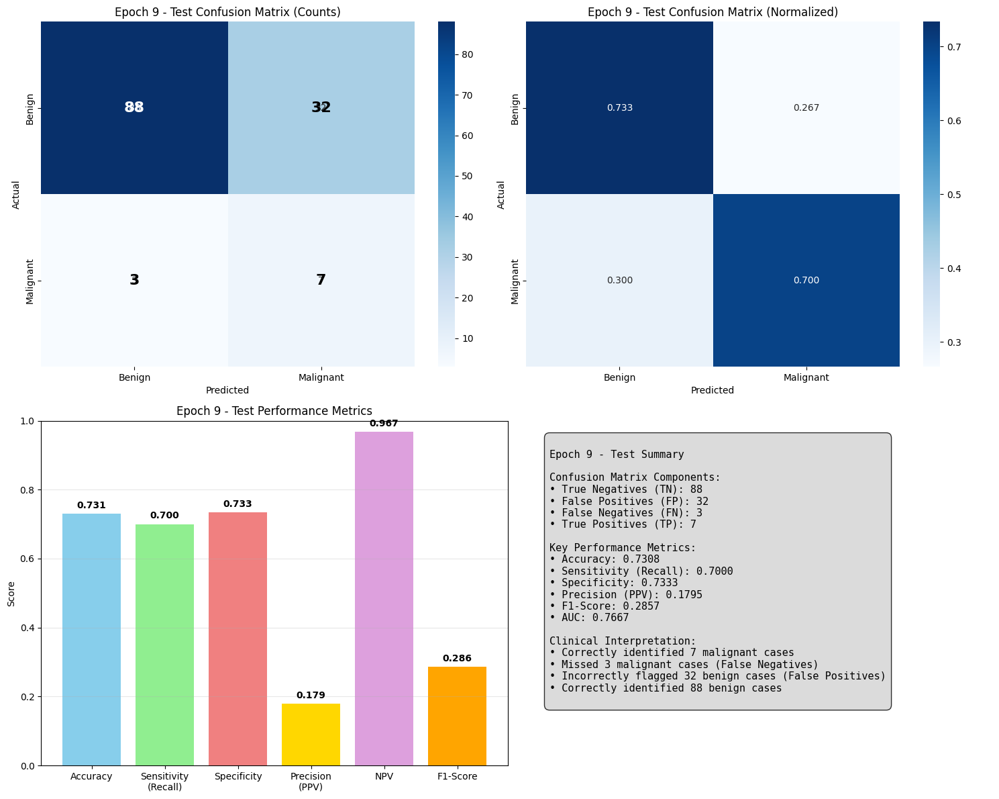

Epoch 9 Test Results:
  Accuracy: 0.7308
  Sensitivity: 0.7000
  Specificity: 0.7333
  F1-Score: 0.2857
  TP: 7, TN: 88
  FP: 32, FN: 3

Analyzing Epoch 10/15
--------------------------------------------------
Loaded pretrained weights for efficientnet-b0
Successfully loaded model from epoch 10
Confusion matrix for Epoch 10 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_10_train_confusion_matrix.png


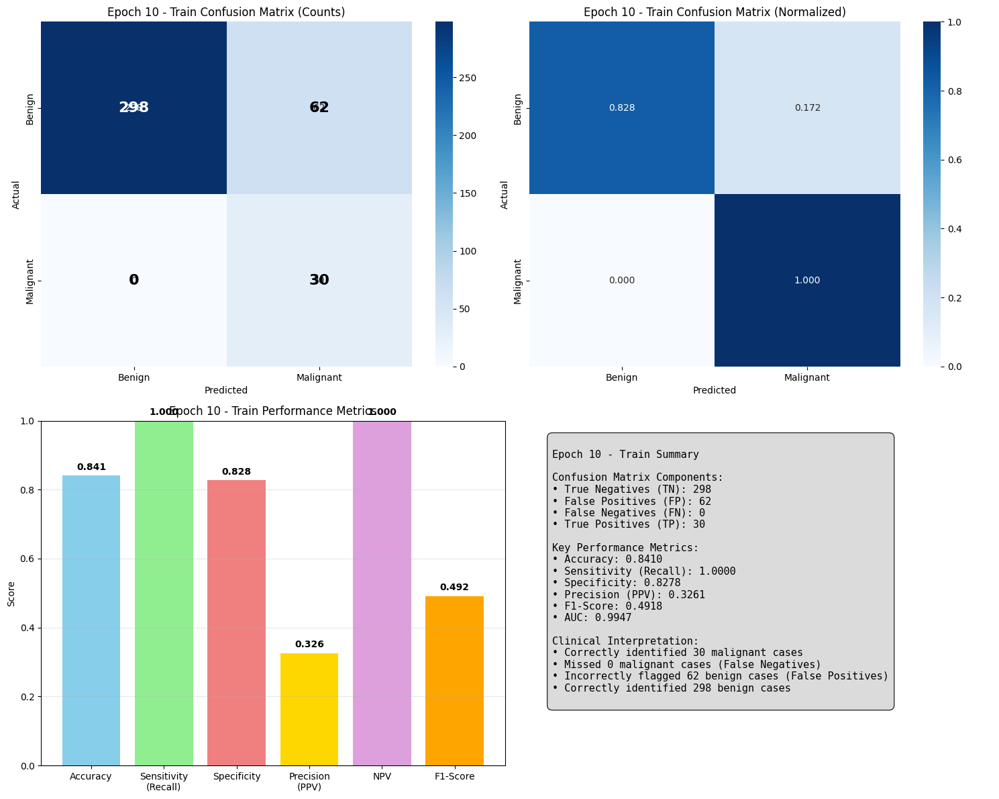

Confusion matrix for Epoch 10 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_10_validation_confusion_matrix.png


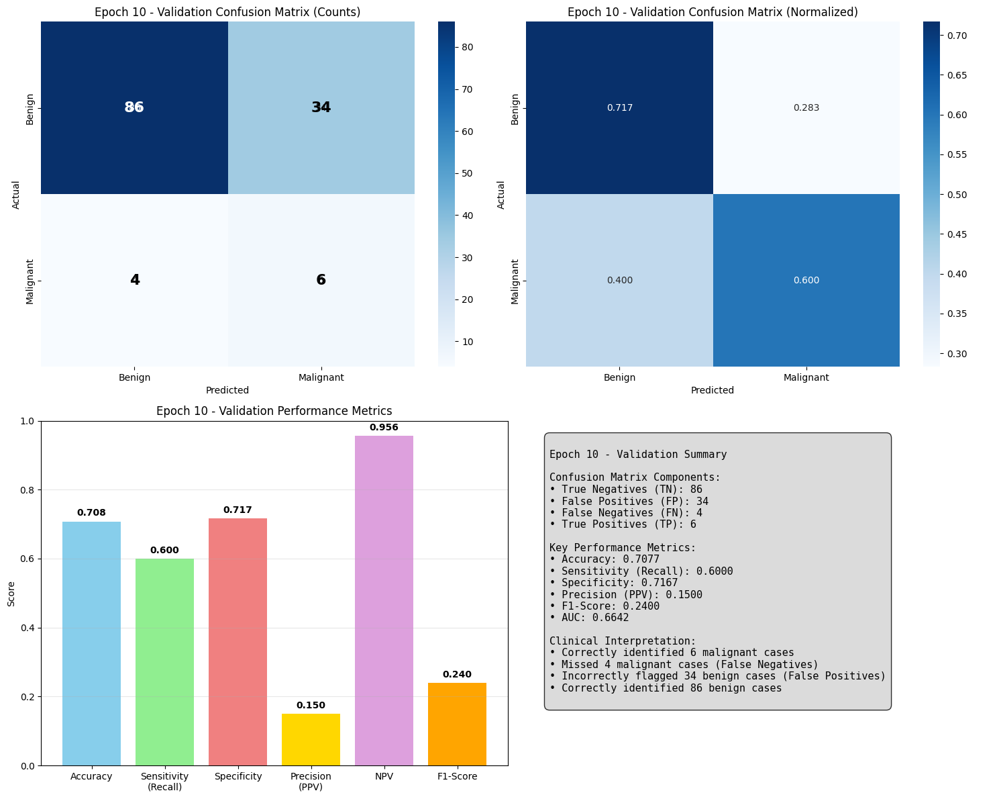

Confusion matrix for Epoch 10 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_10_test_confusion_matrix.png


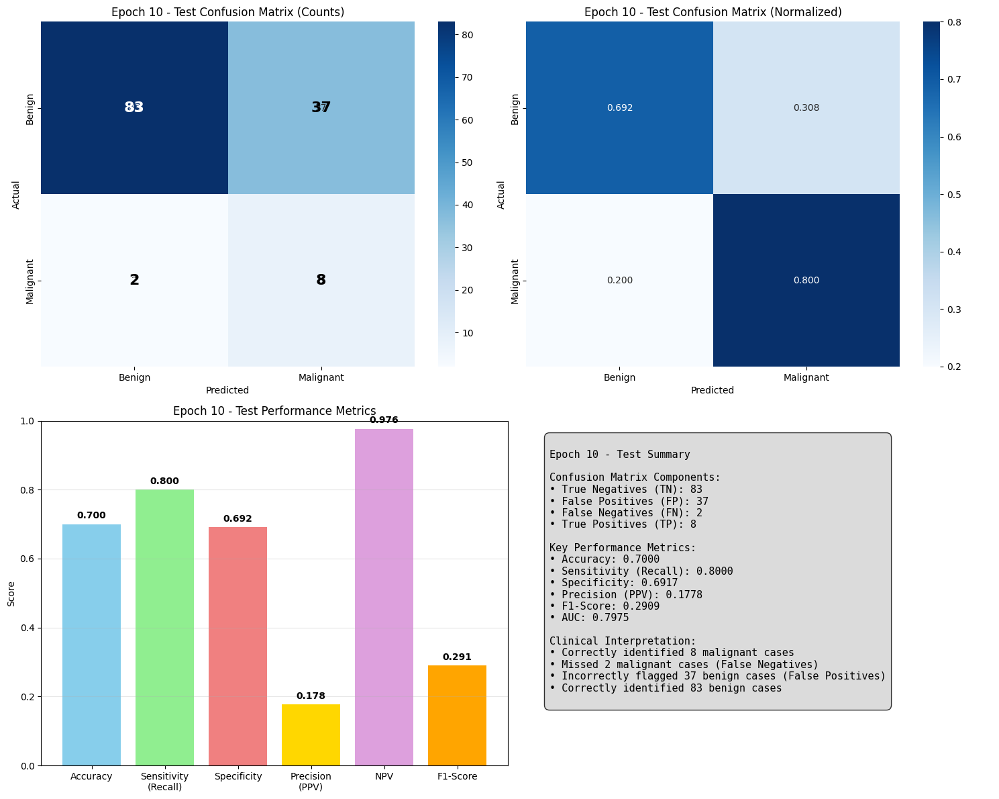

Epoch 10 Test Results:
  Accuracy: 0.7000
  Sensitivity: 0.8000
  Specificity: 0.6917
  F1-Score: 0.2909
  TP: 8, TN: 83
  FP: 37, FN: 2

Analyzing Epoch 11/15
--------------------------------------------------
Loaded pretrained weights for efficientnet-b0
Successfully loaded model from epoch 11
Confusion matrix for Epoch 11 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_11_train_confusion_matrix.png


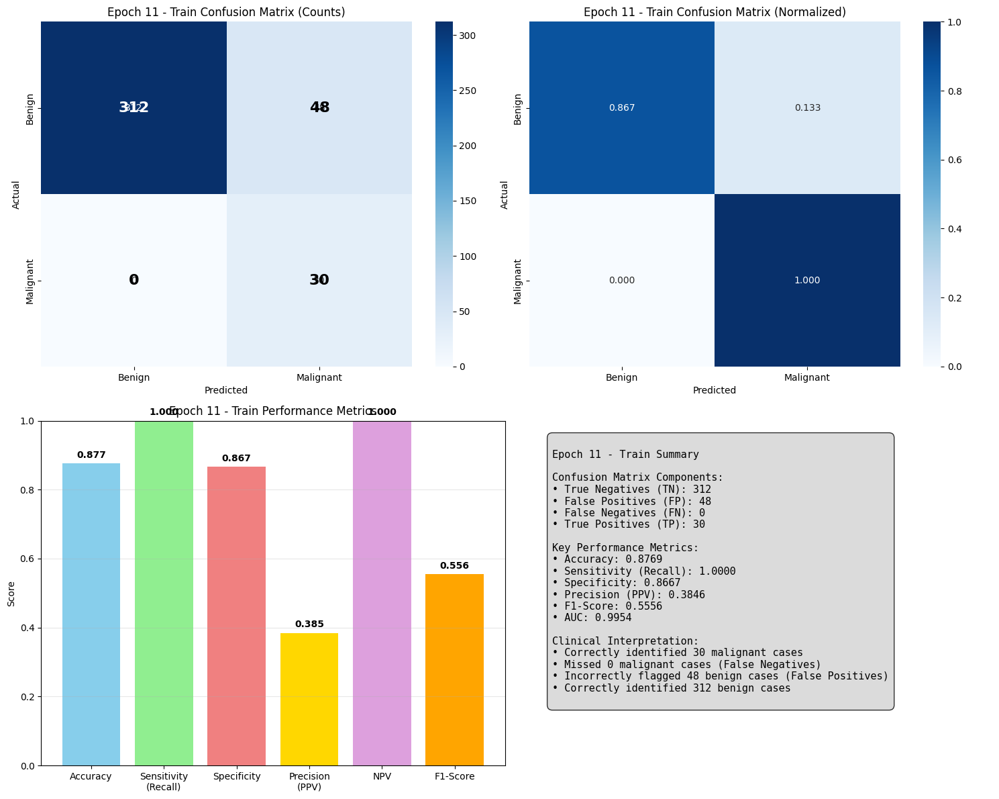

Confusion matrix for Epoch 11 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_11_validation_confusion_matrix.png


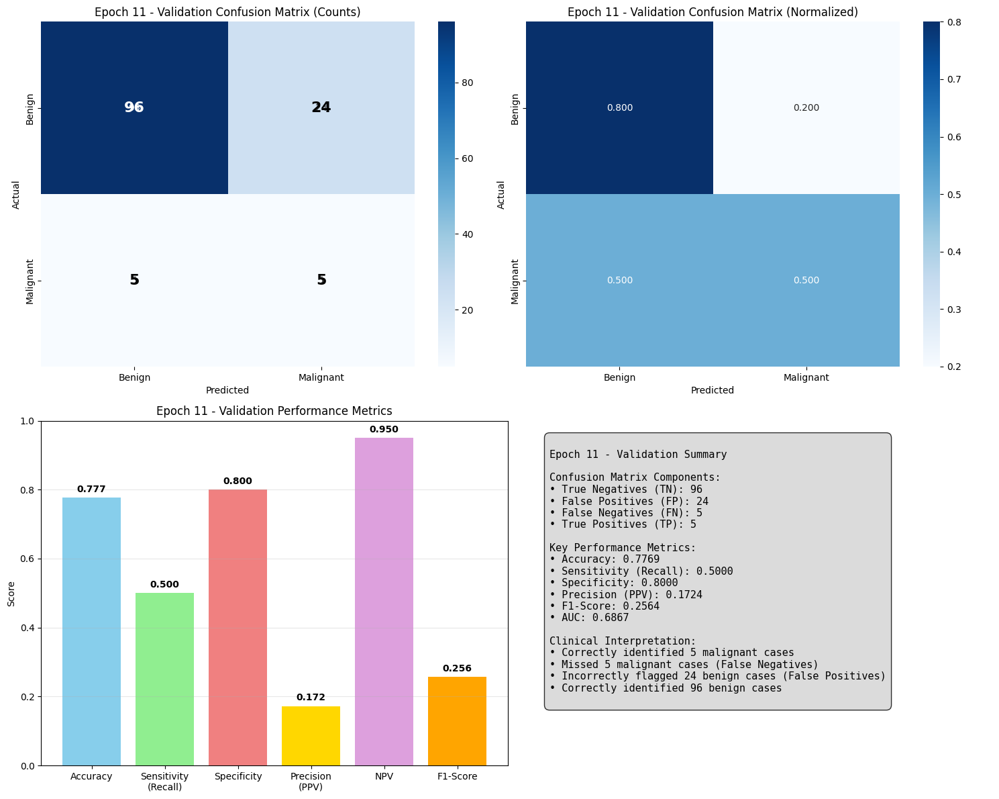

Confusion matrix for Epoch 11 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_11_test_confusion_matrix.png


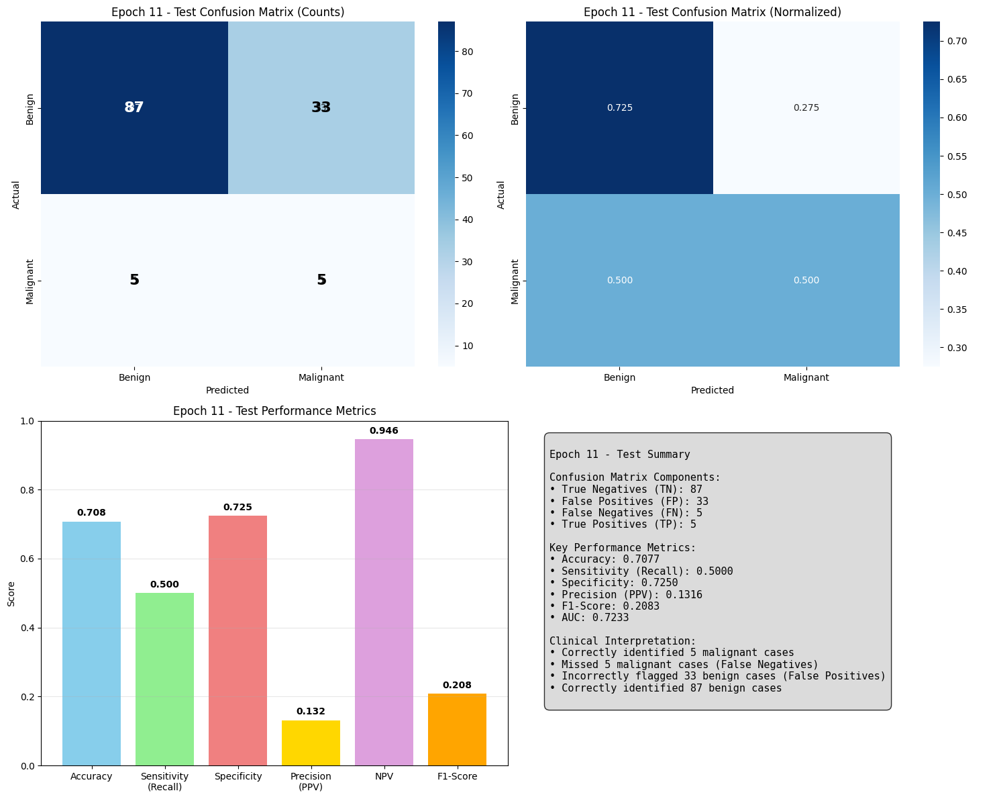

Epoch 11 Test Results:
  Accuracy: 0.7077
  Sensitivity: 0.5000
  Specificity: 0.7250
  F1-Score: 0.2083
  TP: 5, TN: 87
  FP: 33, FN: 5

Analyzing Epoch 12/15
--------------------------------------------------
Loaded pretrained weights for efficientnet-b0
Successfully loaded model from epoch 12
Confusion matrix for Epoch 12 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_12_train_confusion_matrix.png


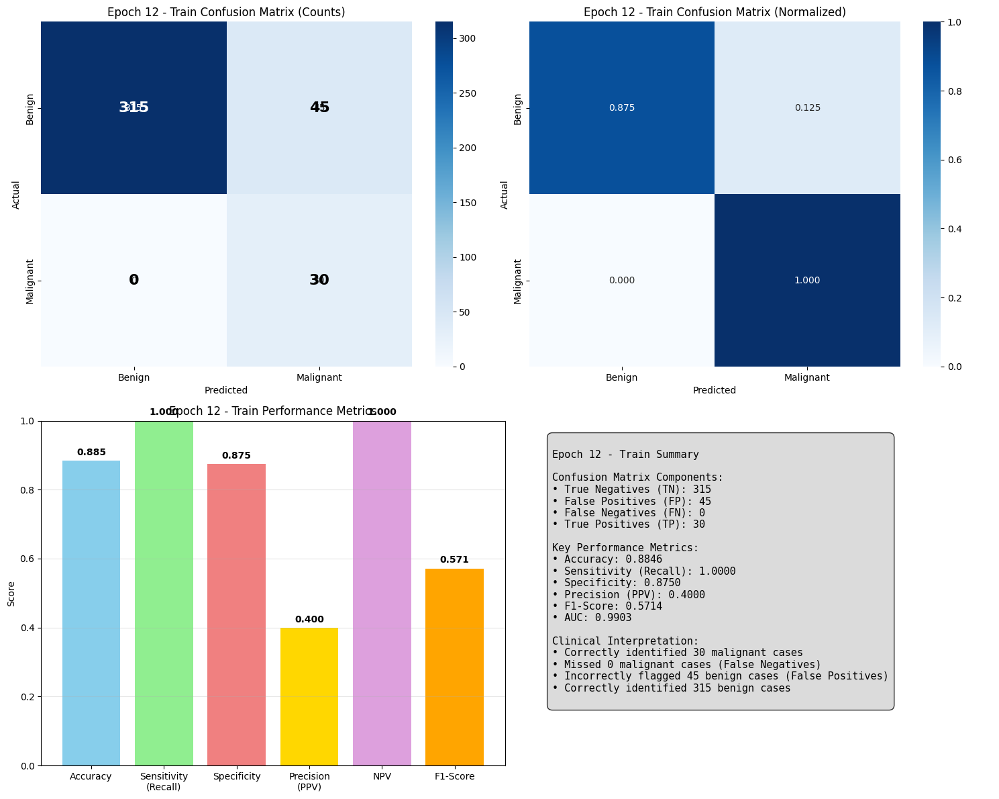

Confusion matrix for Epoch 12 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_12_validation_confusion_matrix.png


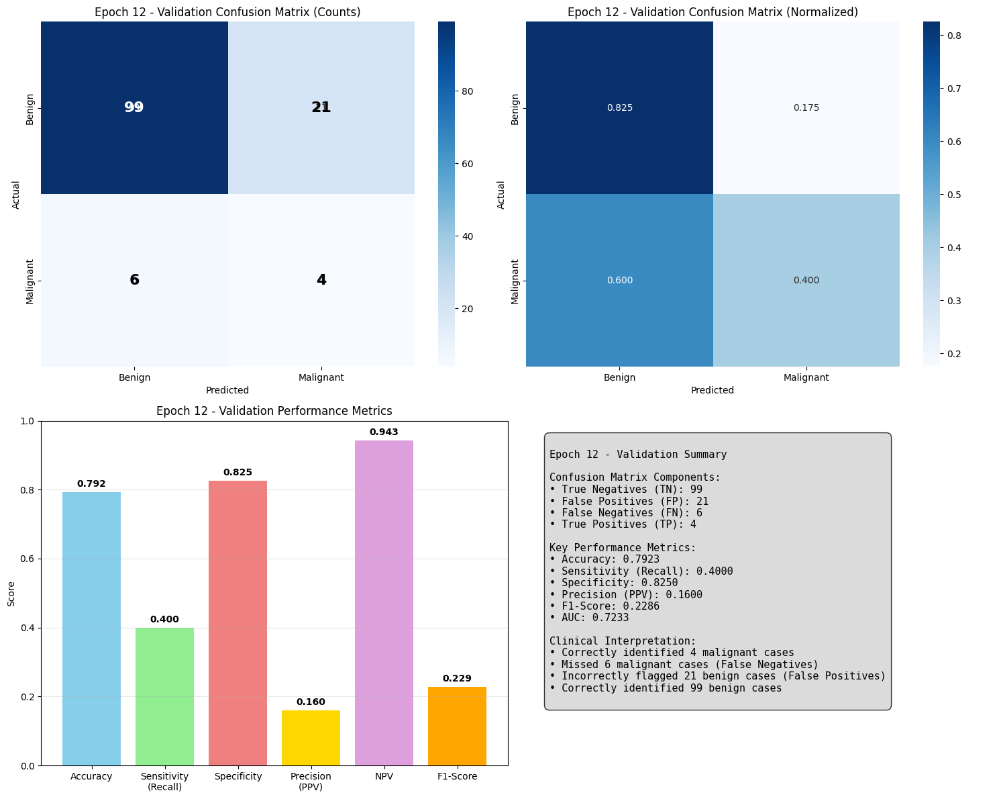

Confusion matrix for Epoch 12 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_12_test_confusion_matrix.png


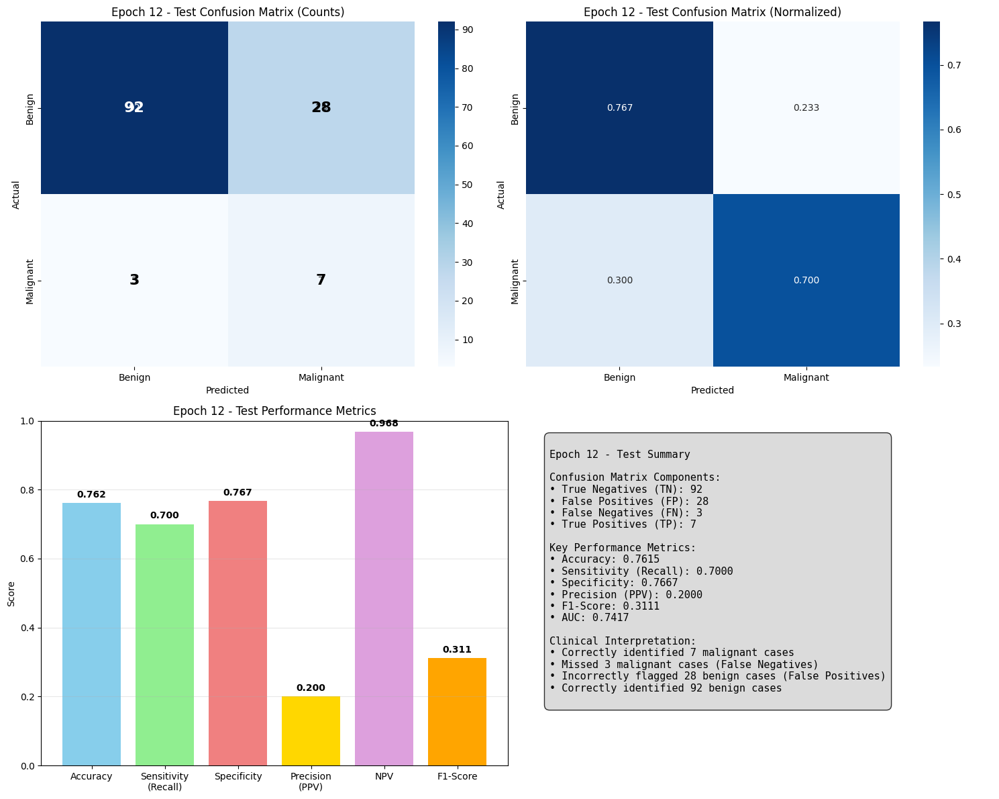

Epoch 12 Test Results:
  Accuracy: 0.7615
  Sensitivity: 0.7000
  Specificity: 0.7667
  F1-Score: 0.3111
  TP: 7, TN: 92
  FP: 28, FN: 3

Analyzing Epoch 13/15
--------------------------------------------------
Loaded pretrained weights for efficientnet-b0
Successfully loaded model from epoch 13
Confusion matrix for Epoch 13 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_13_train_confusion_matrix.png


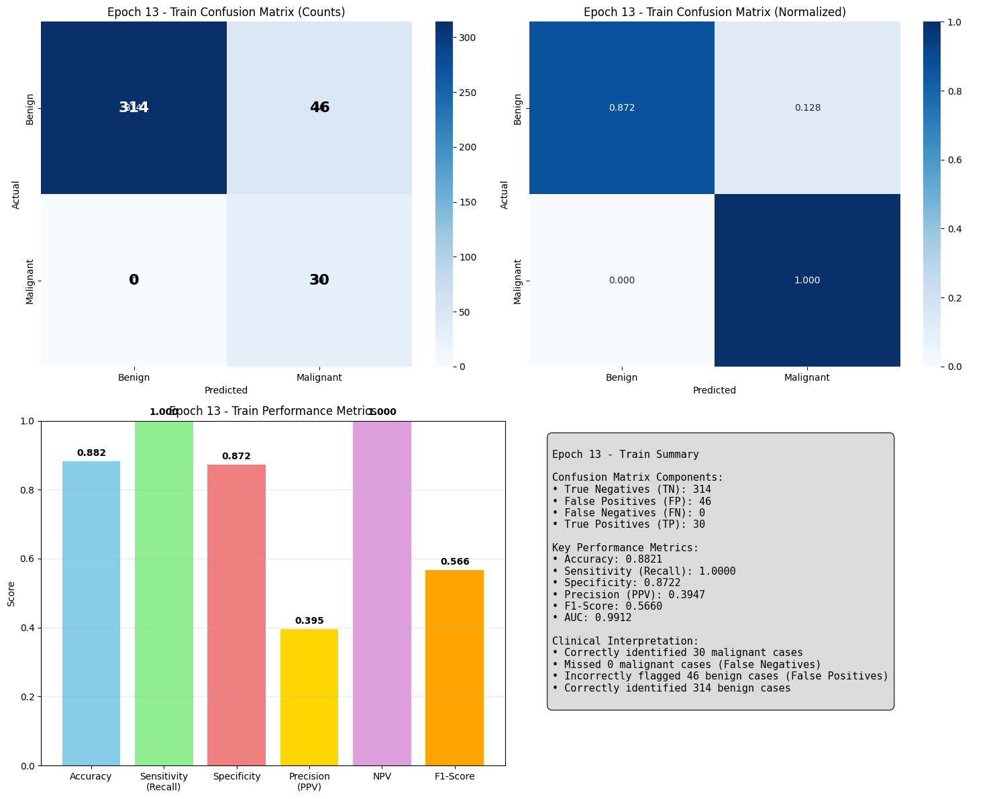

Confusion matrix for Epoch 13 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_13_validation_confusion_matrix.png


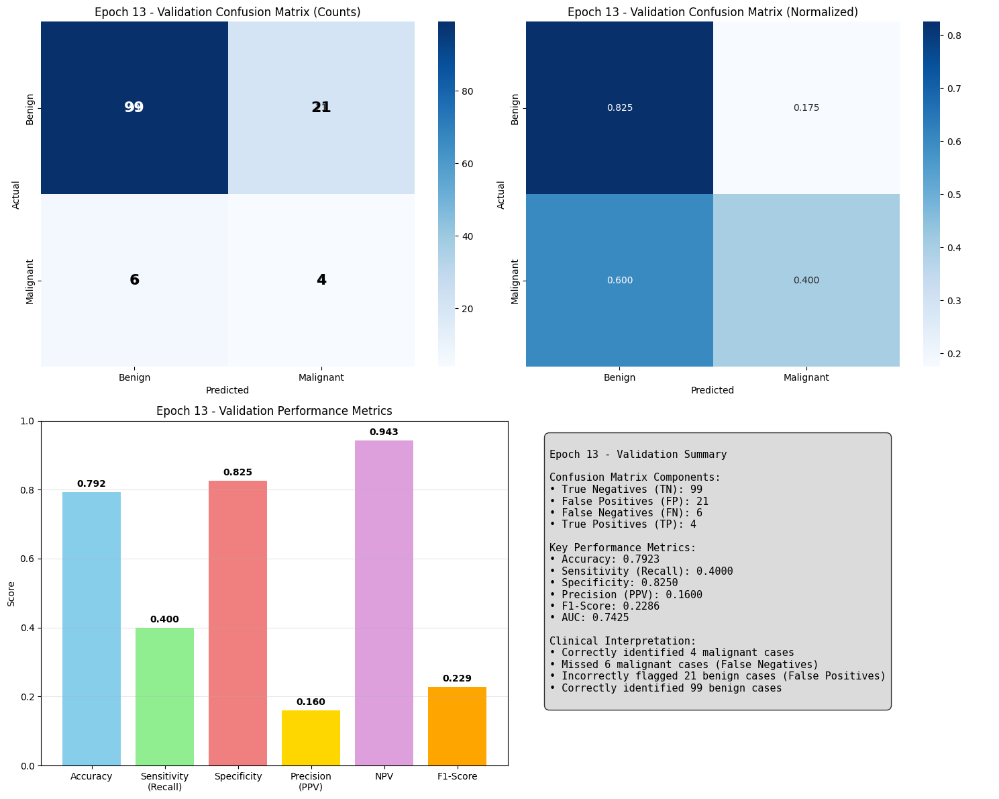

Confusion matrix for Epoch 13 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_13_test_confusion_matrix.png


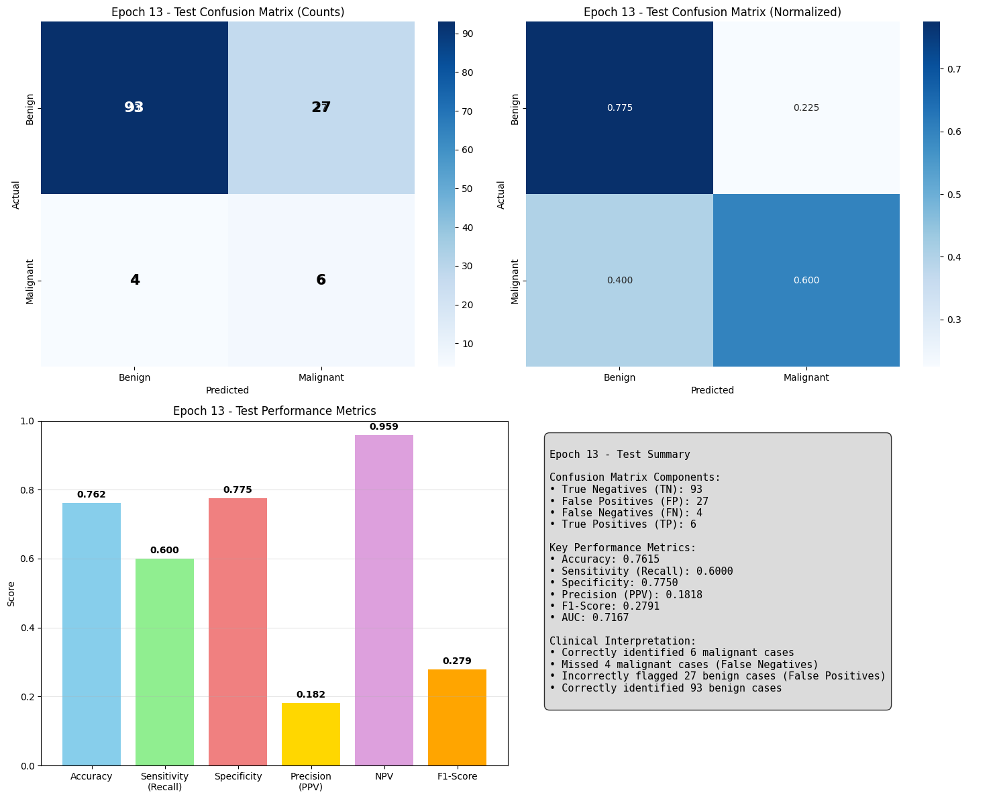

Epoch 13 Test Results:
  Accuracy: 0.7615
  Sensitivity: 0.6000
  Specificity: 0.7750
  F1-Score: 0.2791
  TP: 6, TN: 93
  FP: 27, FN: 4

Analyzing Epoch 14/15
--------------------------------------------------
Loaded pretrained weights for efficientnet-b0
Successfully loaded model from epoch 14
Confusion matrix for Epoch 14 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_14_train_confusion_matrix.png


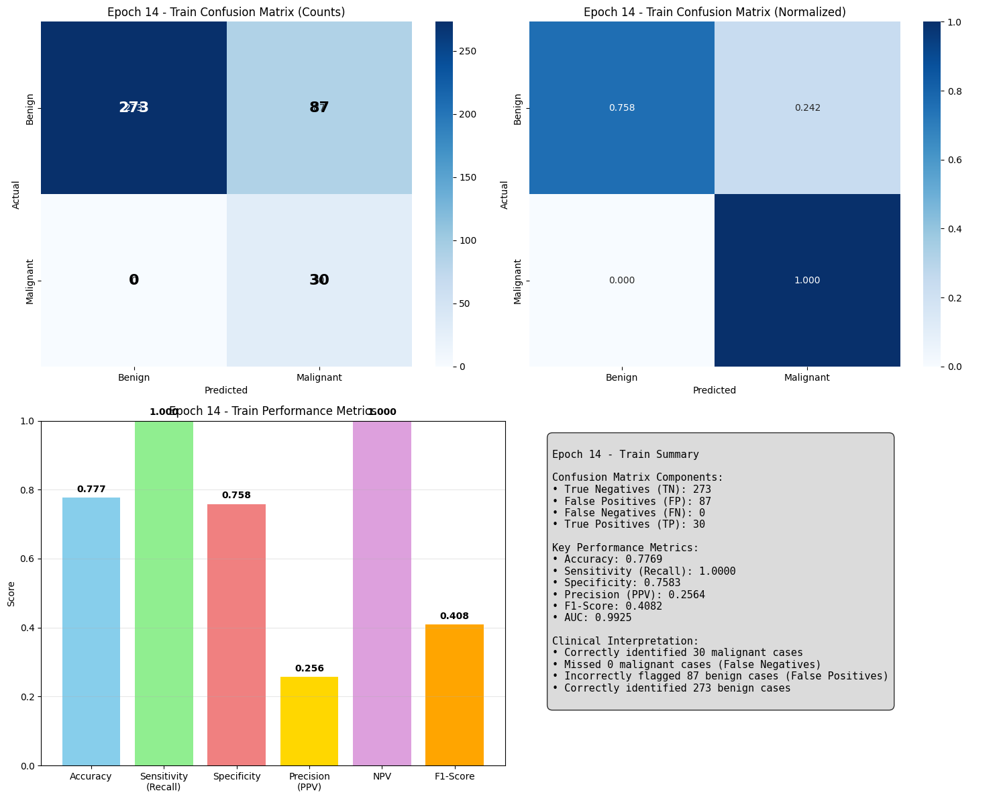

Confusion matrix for Epoch 14 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_14_validation_confusion_matrix.png


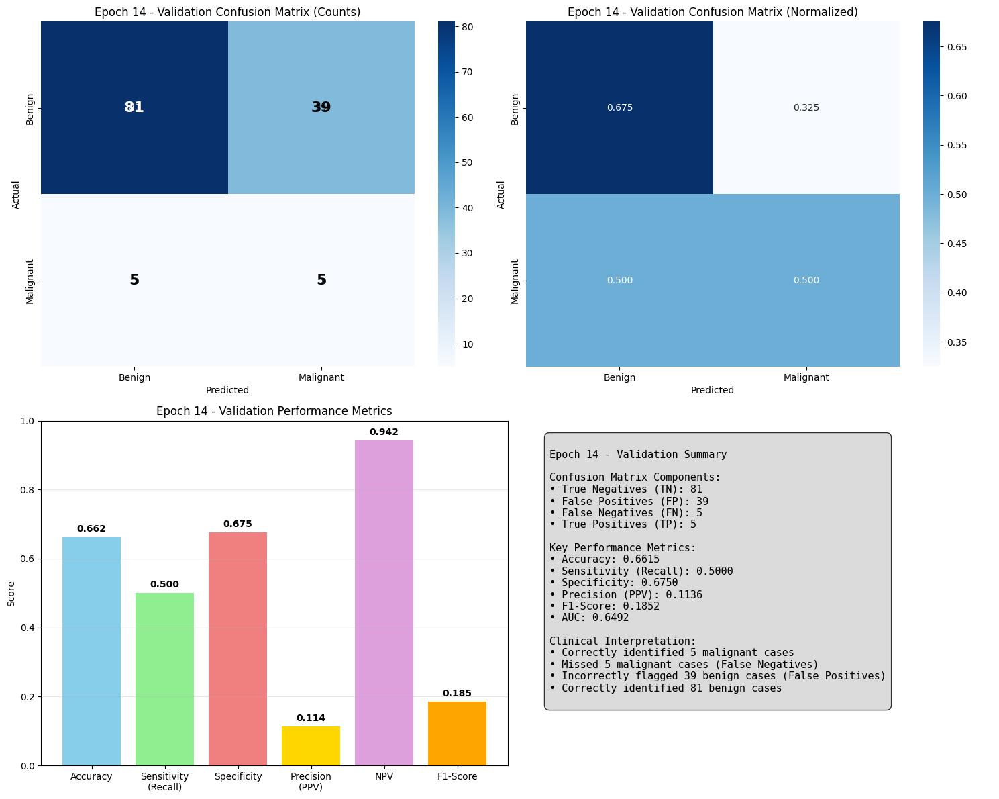

Confusion matrix for Epoch 14 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_14_test_confusion_matrix.png


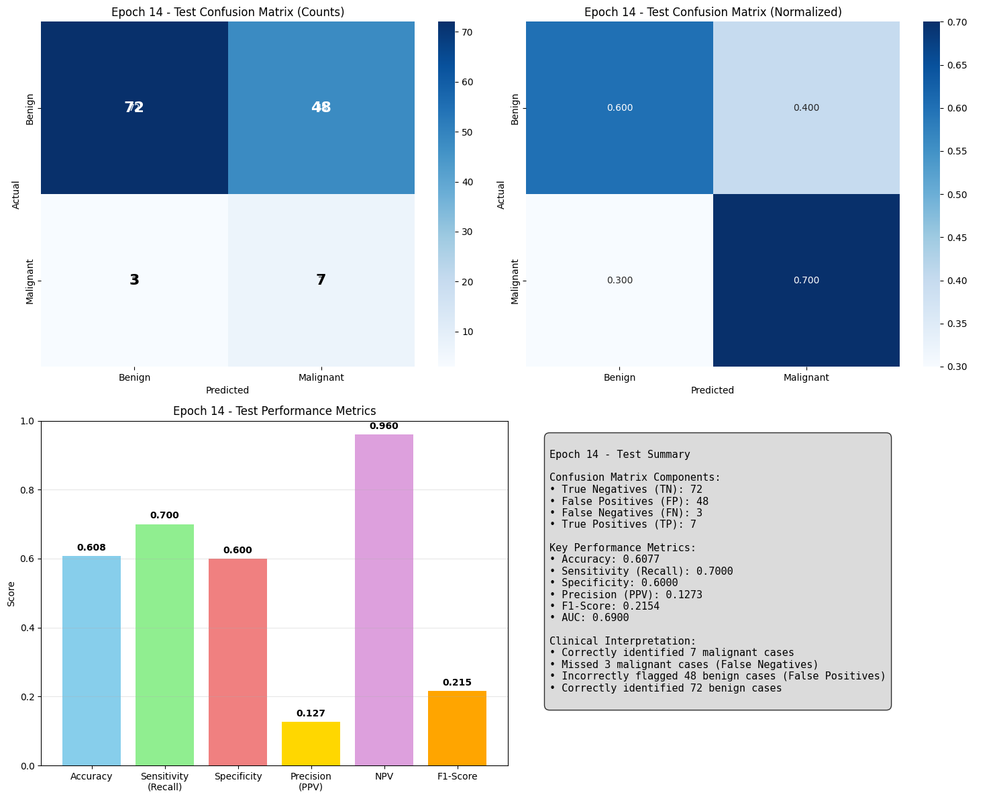

Epoch 14 Test Results:
  Accuracy: 0.6077
  Sensitivity: 0.7000
  Specificity: 0.6000
  F1-Score: 0.2154
  TP: 7, TN: 72
  FP: 48, FN: 3

Analyzing Epoch 15/15
--------------------------------------------------
Loaded pretrained weights for efficientnet-b0
Successfully loaded model from epoch 15
Confusion matrix for Epoch 15 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_15_train_confusion_matrix.png


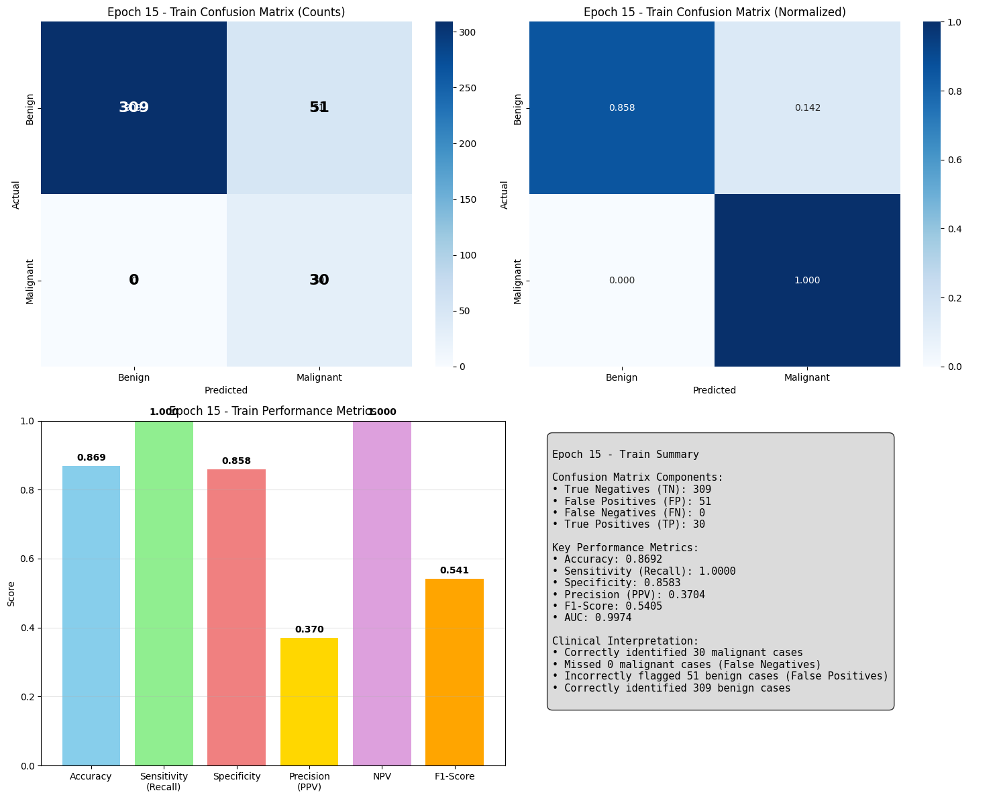

Confusion matrix for Epoch 15 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_15_validation_confusion_matrix.png


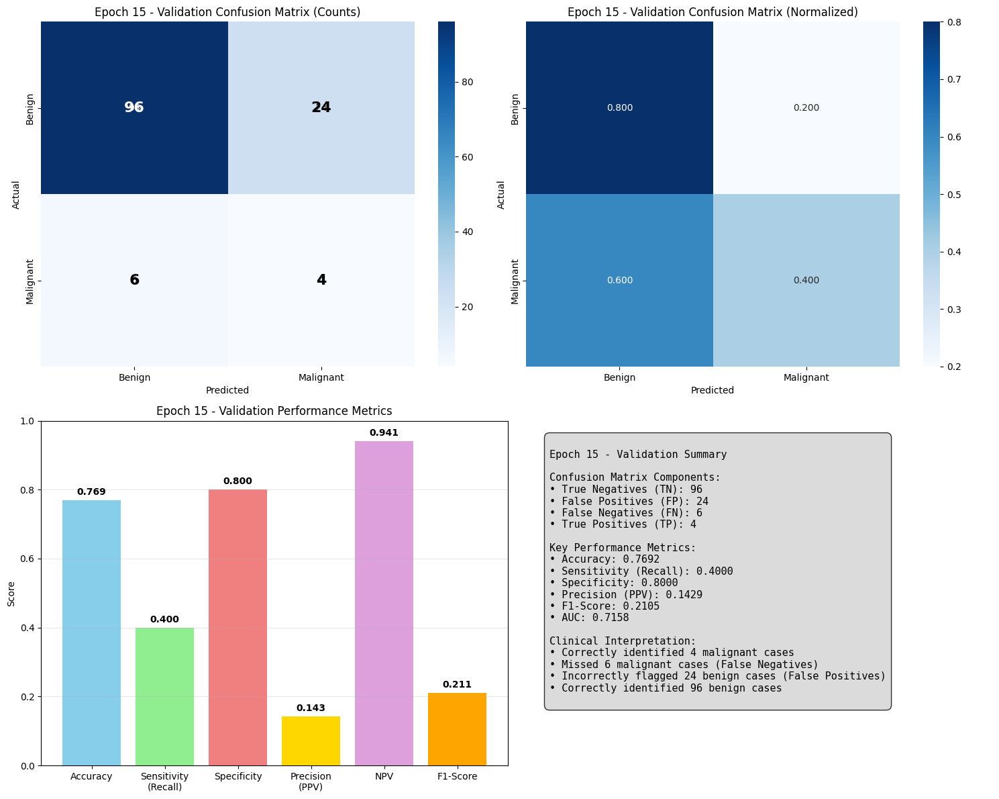

Confusion matrix for Epoch 15 saved to: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices/epoch_15_test_confusion_matrix.png


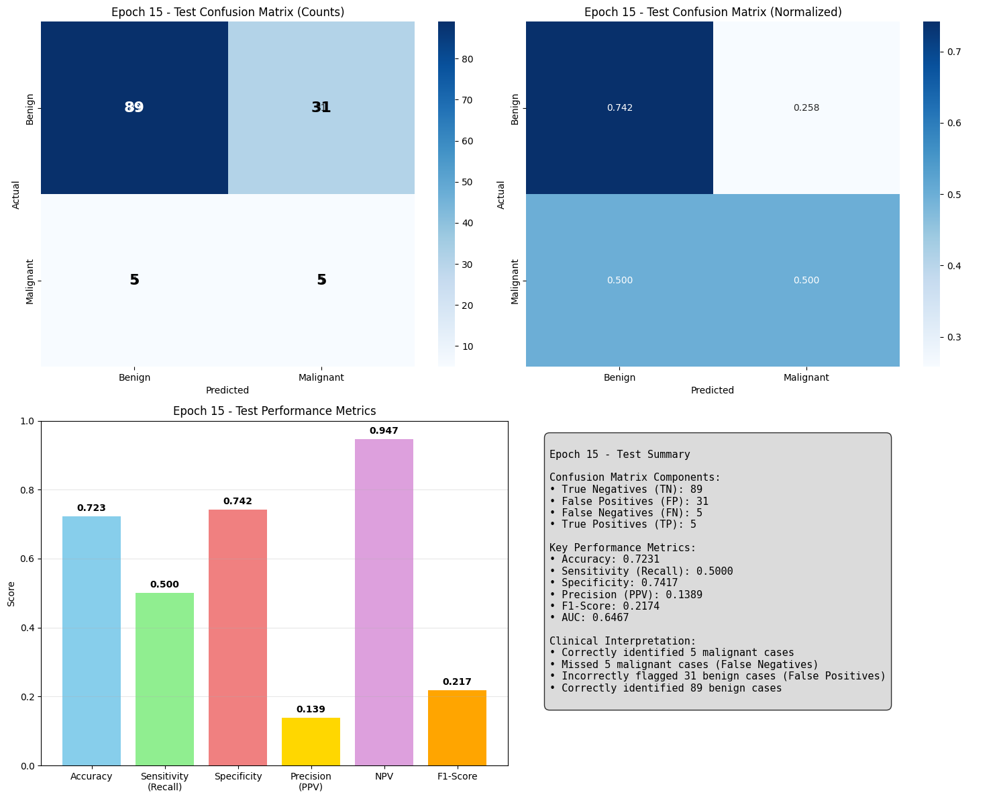

Epoch 15 Test Results:
  Accuracy: 0.7231
  Sensitivity: 0.5000
  Specificity: 0.7417
  F1-Score: 0.2174
  TP: 5, TN: 89
  FP: 31, FN: 5

Detailed epoch analysis saved to: /content/drive/MyDrive/epoch_models/detailed_epoch_confusion_analysis.csv
All confusion matrix plots saved in: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices
Creating epoch comparison plots...


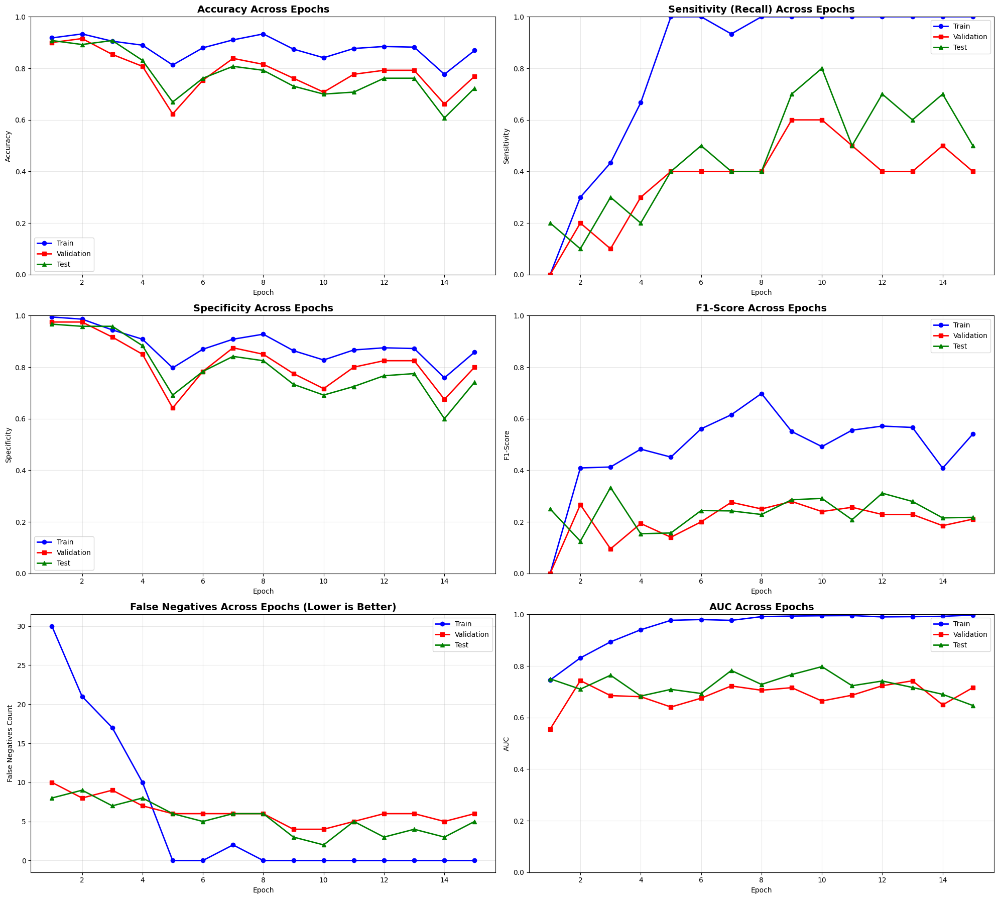

Epoch comparison plots saved to: /content/drive/MyDrive/epoch_models/epoch_metrics_comparison.png

Best Performing Epochs Summary:
Best Test Accuracy: Epoch 1 with 0.9077
Best Test Sensitivity (Recall): Epoch 10 with 0.8000
Best Test Specificity: Epoch 1 with 0.9667
Best Test F1-Score: Epoch 3 with 0.3333
Best Test False Negatives (Lower is Better): Epoch 10 with 2 FN

All confusion matrix analyses complete!
Results saved in: /content/drive/MyDrive/epoch_models
Individual confusion matrices saved in: /content/drive/MyDrive/epoch_models/epoch_confusion_matrices


In [ ]:
# Cell 15: Confusion Matrix Analysis for All Epoch Models
import os
import glob
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, precision_score, f1_score
import numpy as np
import pandas as pd

def load_epoch_model(epoch_num, model_save_dir):
    """
    Load a specific epoch model
    """
    model_path = os.path.join(model_save_dir, f'CLASSImbalance_images_efficientnet_b0_epoch_{epoch_num}.pth')

    if not os.path.exists(model_path):
        print(f"Model file not found: {model_path}")
        return None

    # Setup fresh model architecture
    model = EfficientNet.from_pretrained("efficientnet-b0")
    model._fc = nn.Linear(model._fc.in_features, 1)
    model = model.to(DEVICE)

    # Load the saved checkpoint
    checkpoint = torch.load(model_path, map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.eval()

    return model, checkpoint

def evaluate_epoch_model_detailed(model, loader, epoch_num, dataset_name=""):
    """
    Detailed evaluation for a specific epoch model
    """
    model.eval()
    all_preds, all_labels = [], []
    all_probs = []

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(DEVICE)
            outputs = model(images)
            probs = torch.sigmoid(outputs).cpu().numpy().flatten()
            all_probs.extend(probs)
            all_labels.extend(labels.numpy().flatten())

    # Convert to numpy arrays
    all_probs = np.array(all_probs)
    all_labels = np.array(all_labels)

    # Binary predictions with 0.5 threshold
    bin_preds = (all_probs >= 0.5).astype(int)

    # Calculate all metrics
    acc = accuracy_score(all_labels, bin_preds)
    auc = roc_auc_score(all_labels, all_probs) if len(set(all_labels)) > 1 else 0.0
    recall = recall_score(all_labels, bin_preds, zero_division=0)
    precision = precision_score(all_labels, bin_preds, zero_division=0)
    f1 = f1_score(all_labels, bin_preds, zero_division=0)

    # Confusion Matrix
    cm = confusion_matrix(all_labels, bin_preds)
    tn, fp, fn, tp = cm.ravel()

    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
    ppv = tp / (tp + fp) if (tp + fp) > 0 else 0
    npv = tn / (tn + fn) if (tn + fn) > 0 else 0

    return {
        'epoch': epoch_num,
        'dataset': dataset_name,
        'accuracy': acc,
        'auc': auc,
        'sensitivity_recall': sensitivity,
        'specificity': specificity,
        'precision_ppv': precision,
        'npv': npv,
        'f1_score': f1,
        'true_negatives': tn,
        'false_positives': fp,
        'false_negatives': fn,
        'true_positives': tp,
        'confusion_matrix': cm,
        'probabilities': all_probs,
        'true_labels': all_labels,
        'predictions': bin_preds
    }

def create_epoch_confusion_matrix_plot(metrics_data, save_path=None):
    """
    Create confusion matrix plot for a specific epoch
    """
    epoch_num = metrics_data['epoch']
    dataset_name = metrics_data['dataset']
    cm = metrics_data['confusion_matrix']

    tn, fp, fn, tp = cm.ravel()

    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))

    # 1. Confusion Matrix (Raw Numbers)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax1,
                xticklabels=['Benign', 'Malignant'],
                yticklabels=['Benign', 'Malignant'])
    ax1.set_title(f'Epoch {epoch_num} - {dataset_name} Confusion Matrix (Counts)')
    ax1.set_xlabel('Predicted')
    ax1.set_ylabel('Actual')

    # Add text annotations for clarity
    for i in range(2):
        for j in range(2):
            text = ax1.text(j+0.5, i+0.5, cm[i, j], ha="center", va="center",
                           color="white" if cm[i, j] > cm.max()/2 else "black", fontsize=16, fontweight='bold')

    # 2. Confusion Matrix (Normalized)
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    sns.heatmap(cm_normalized, annot=True, fmt='.3f', cmap='Blues', ax=ax2,
                xticklabels=['Benign', 'Malignant'],
                yticklabels=['Benign', 'Malignant'])
    ax2.set_title(f'Epoch {epoch_num} - {dataset_name} Confusion Matrix (Normalized)')
    ax2.set_xlabel('Predicted')
    ax2.set_ylabel('Actual')

    # 3. Metrics Bar Chart
    metrics_names = ['Accuracy', 'Sensitivity\n(Recall)', 'Specificity', 'Precision\n(PPV)', 'NPV', 'F1-Score']
    metrics_values = [
        metrics_data['accuracy'],
        metrics_data['sensitivity_recall'],
        metrics_data['specificity'],
        metrics_data['precision_ppv'],
        metrics_data['npv'],
        metrics_data['f1_score']
    ]

    bars = ax3.bar(metrics_names, metrics_values, color=['skyblue', 'lightgreen', 'lightcoral', 'gold', 'plum', 'orange'])
    ax3.set_title(f'Epoch {epoch_num} - {dataset_name} Performance Metrics')
    ax3.set_ylabel('Score')
    ax3.set_ylim(0, 1)
    ax3.grid(axis='y', alpha=0.3)

    # Add value labels on bars
    for bar, value in zip(bars, metrics_values):
        height = bar.get_height()
        ax3.text(bar.get_x() + bar.get_width()/2., height + 0.01,
                f'{value:.3f}', ha='center', va='bottom', fontweight='bold')

    # 4. Key Metrics Text Summary
    ax4.axis('off')
    summary_text = f"""
Epoch {epoch_num} - {dataset_name} Summary

Confusion Matrix Components:
• True Negatives (TN): {tn}
• False Positives (FP): {fp}
• False Negatives (FN): {fn}
• True Positives (TP): {tp}

Key Performance Metrics:
• Accuracy: {metrics_data['accuracy']:.4f}
• Sensitivity (Recall): {metrics_data['sensitivity_recall']:.4f}
• Specificity: {metrics_data['specificity']:.4f}
• Precision (PPV): {metrics_data['precision_ppv']:.4f}
• F1-Score: {metrics_data['f1_score']:.4f}
• AUC: {metrics_data['auc']:.4f}

Clinical Interpretation:
• Correctly identified {tp} malignant cases
• Missed {fn} malignant cases (False Negatives)
• Incorrectly flagged {fp} benign cases (False Positives)
• Correctly identified {tn} benign cases
    """

    ax4.text(0.05, 0.95, summary_text, transform=ax4.transAxes, fontsize=11,
             verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle="round,pad=0.5", facecolor="lightgray", alpha=0.8))

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Confusion matrix for Epoch {epoch_num} saved to: {save_path}")

    plt.show()

def analyze_all_epoch_models(model_save_dir, train_loader, val_loader, test_loader, epochs=15):
    """
    Analyze all epoch models with confusion matrices
    """
    print("Starting Confusion Matrix Analysis for All Epoch Models")
    print("=" * 80)

    # Create directory for epoch confusion matrices
    epoch_cm_dir = os.path.join(model_save_dir, 'epoch_confusion_matrices')
    os.makedirs(epoch_cm_dir, exist_ok=True)

    all_epoch_results = []

    for epoch_num in range(1, epochs + 1):
        print(f"\nAnalyzing Epoch {epoch_num}/{epochs}")
        print("-" * 50)

        # Load the epoch model
        try:
            model, checkpoint = load_epoch_model(epoch_num, model_save_dir)
            if model is None:
                print(f"Skipping epoch {epoch_num} - model not found")
                continue

            print(f"Successfully loaded model from epoch {epoch_num}")

            # Evaluate on all datasets
            train_metrics = evaluate_epoch_model_detailed(model, train_loader, epoch_num, "Train")
            val_metrics = evaluate_epoch_model_detailed(model, val_loader, epoch_num, "Validation")
            test_metrics = evaluate_epoch_model_detailed(model, test_loader, epoch_num, "Test")

            # Create confusion matrix plots for each dataset
            datasets = [
                (train_metrics, "train"),
                (val_metrics, "validation"),
                (test_metrics, "test")
            ]

            for metrics, dataset_type in datasets:
                save_path = os.path.join(epoch_cm_dir, f'epoch_{epoch_num}_{dataset_type}_confusion_matrix.png')
                create_epoch_confusion_matrix_plot(metrics, save_path)

            # Store results
            epoch_results = {
                'epoch': epoch_num,
                'train_loss': checkpoint.get('train_loss', 0),
                'val_loss': checkpoint.get('val_loss', 0),
                # Train metrics
                'train_acc': train_metrics['accuracy'],
                'train_auc': train_metrics['auc'],
                'train_sensitivity': train_metrics['sensitivity_recall'],
                'train_specificity': train_metrics['specificity'],
                'train_precision': train_metrics['precision_ppv'],
                'train_f1': train_metrics['f1_score'],
                'train_tp': train_metrics['true_positives'],
                'train_tn': train_metrics['true_negatives'],
                'train_fp': train_metrics['false_positives'],
                'train_fn': train_metrics['false_negatives'],
                # Validation metrics
                'val_acc': val_metrics['accuracy'],
                'val_auc': val_metrics['auc'],
                'val_sensitivity': val_metrics['sensitivity_recall'],
                'val_specificity': val_metrics['specificity'],
                'val_precision': val_metrics['precision_ppv'],
                'val_f1': val_metrics['f1_score'],
                'val_tp': val_metrics['true_positives'],
                'val_tn': val_metrics['true_negatives'],
                'val_fp': val_metrics['false_positives'],
                'val_fn': val_metrics['false_negatives'],
                # Test metrics
                'test_acc': test_metrics['accuracy'],
                'test_auc': test_metrics['auc'],
                'test_sensitivity': test_metrics['sensitivity_recall'],
                'test_specificity': test_metrics['specificity'],
                'test_precision': test_metrics['precision_ppv'],
                'test_f1': test_metrics['f1_score'],
                'test_tp': test_metrics['true_positives'],
                'test_tn': test_metrics['true_negatives'],
                'test_fp': test_metrics['false_positives'],
                'test_fn': test_metrics['false_negatives']
            }

            all_epoch_results.append(epoch_results)

            # Print summary for this epoch
            print(f"Epoch {epoch_num} Test Results:")
            print(f"  Accuracy: {test_metrics['accuracy']:.4f}")
            print(f"  Sensitivity: {test_metrics['sensitivity_recall']:.4f}")
            print(f"  Specificity: {test_metrics['specificity']:.4f}")
            print(f"  F1-Score: {test_metrics['f1_score']:.4f}")
            print(f"  TP: {test_metrics['true_positives']}, TN: {test_metrics['true_negatives']}")
            print(f"  FP: {test_metrics['false_positives']}, FN: {test_metrics['false_negatives']}")

        except Exception as e:
            print(f"Error processing epoch {epoch_num}: {str(e)}")
            continue

    # Convert to DataFrame and save
    epoch_results_df = pd.DataFrame(all_epoch_results)
    detailed_results_path = os.path.join(model_save_dir, 'detailed_epoch_confusion_analysis.csv')
    epoch_results_df.to_csv(detailed_results_path, index=False)

    print(f"\nDetailed epoch analysis saved to: {detailed_results_path}")
    print(f"All confusion matrix plots saved in: {epoch_cm_dir}")

    return epoch_results_df

def create_epoch_comparison_plots(epoch_results_df, model_save_dir):
    """
    Create comparison plots across all epochs
    """
    print("Creating epoch comparison plots...")

    fig, axes = plt.subplots(3, 2, figsize=(20, 18))
    epochs = epoch_results_df['epoch']

    # 1. Accuracy Comparison
    axes[0, 0].plot(epochs, epoch_results_df['train_acc'], 'b-o', label='Train', linewidth=2)
    axes[0, 0].plot(epochs, epoch_results_df['val_acc'], 'r-s', label='Validation', linewidth=2)
    axes[0, 0].plot(epochs, epoch_results_df['test_acc'], 'g-^', label='Test', linewidth=2)
    axes[0, 0].set_title('Accuracy Across Epochs', fontsize=14, fontweight='bold')
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].set_ylabel('Accuracy')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)
    axes[0, 0].set_ylim(0, 1)

    # 2. Sensitivity (Recall) Comparison
    axes[0, 1].plot(epochs, epoch_results_df['train_sensitivity'], 'b-o', label='Train', linewidth=2)
    axes[0, 1].plot(epochs, epoch_results_df['val_sensitivity'], 'r-s', label='Validation', linewidth=2)
    axes[0, 1].plot(epochs, epoch_results_df['test_sensitivity'], 'g-^', label='Test', linewidth=2)
    axes[0, 1].set_title('Sensitivity (Recall) Across Epochs', fontsize=14, fontweight='bold')
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].set_ylabel('Sensitivity')
    axes[0, 1].legend()
    axes[0, 1].grid(True, alpha=0.3)
    axes[0, 1].set_ylim(0, 1)

    # 3. Specificity Comparison
    axes[1, 0].plot(epochs, epoch_results_df['train_specificity'], 'b-o', label='Train', linewidth=2)
    axes[1, 0].plot(epochs, epoch_results_df['val_specificity'], 'r-s', label='Validation', linewidth=2)
    axes[1, 0].plot(epochs, epoch_results_df['test_specificity'], 'g-^', label='Test', linewidth=2)
    axes[1, 0].set_title('Specificity Across Epochs', fontsize=14, fontweight='bold')
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylabel('Specificity')
    axes[1, 0].legend()
    axes[1, 0].grid(True, alpha=0.3)
    axes[1, 0].set_ylim(0, 1)

    # 4. F1-Score Comparison
    axes[1, 1].plot(epochs, epoch_results_df['train_f1'], 'b-o', label='Train', linewidth=2)
    axes[1, 1].plot(epochs, epoch_results_df['val_f1'], 'r-s', label='Validation', linewidth=2)
    axes[1, 1].plot(epochs, epoch_results_df['test_f1'], 'g-^', label='Test', linewidth=2)
    axes[1, 1].set_title('F1-Score Across Epochs', fontsize=14, fontweight='bold')
    axes[1, 1].set_xlabel('Epoch')
    axes[1, 1].set_ylabel('F1-Score')
    axes[1, 1].legend()
    axes[1, 1].grid(True, alpha=0.3)
    axes[1, 1].set_ylim(0, 1)

    # 5. False Negatives (Critical for Medical AI)
    axes[2, 0].plot(epochs, epoch_results_df['train_fn'], 'b-o', label='Train', linewidth=2)
    axes[2, 0].plot(epochs, epoch_results_df['val_fn'], 'r-s', label='Validation', linewidth=2)
    axes[2, 0].plot(epochs, epoch_results_df['test_fn'], 'g-^', label='Test', linewidth=2)
    axes[2, 0].set_title('False Negatives Across Epochs (Lower is Better)', fontsize=14, fontweight='bold')
    axes[2, 0].set_xlabel('Epoch')
    axes[2, 0].set_ylabel('False Negatives Count')
    axes[2, 0].legend()
    axes[2, 0].grid(True, alpha=0.3)

    # 6. AUC Comparison
    axes[2, 1].plot(epochs, epoch_results_df['train_auc'], 'b-o', label='Train', linewidth=2)
    axes[2, 1].plot(epochs, epoch_results_df['val_auc'], 'r-s', label='Validation', linewidth=2)
    axes[2, 1].plot(epochs, epoch_results_df['test_auc'], 'g-^', label='Test', linewidth=2)
    axes[2, 1].set_title('AUC Across Epochs', fontsize=14, fontweight='bold')
    axes[2, 1].set_xlabel('Epoch')
    axes[2, 1].set_ylabel('AUC')
    axes[2, 1].legend()
    axes[2, 1].grid(True, alpha=0.3)
    axes[2, 1].set_ylim(0, 1)

    plt.tight_layout()
    comparison_plot_path = os.path.join(model_save_dir, 'epoch_metrics_comparison.png')
    plt.savefig(comparison_plot_path, dpi=300, bbox_inches='tight')
    plt.show()

    print(f"Epoch comparison plots saved to: {comparison_plot_path}")

# Cell 16: Execute All Epoch Confusion Matrix Analysis

# Run the comprehensive analysis on all epoch models
print("Starting comprehensive confusion matrix analysis for all epochs...")
epoch_results_df = analyze_all_epoch_models(
    MODEL_SAVE_DIR,
    train_loader,
    val_loader,
    test_loader,
    epochs=EPOCHS
)

# Create comparison plots
create_epoch_comparison_plots(epoch_results_df, MODEL_SAVE_DIR)

# Find best epochs for different metrics
print("\nBest Performing Epochs Summary:")
print("=" * 60)

metrics_to_analyze = [
    ('test_acc', 'Test Accuracy'),
    ('test_sensitivity', 'Test Sensitivity (Recall)'),
    ('test_specificity', 'Test Specificity'),
    ('test_f1', 'Test F1-Score'),
    ('test_fn', 'Test False Negatives (Lower is Better)')
]

for metric, description in metrics_to_analyze:
    if metric == 'test_fn':  # For false negatives, we want the minimum
        best_idx = epoch_results_df[metric].idxmin()
        best_value = epoch_results_df.loc[best_idx, metric]
        print(f"Best {description}: Epoch {epoch_results_df.loc[best_idx, 'epoch']} with {best_value} FN")
    else:
        best_idx = epoch_results_df[metric].idxmax()
        best_value = epoch_results_df.loc[best_idx, metric]
        print(f"Best {description}: Epoch {epoch_results_df.loc[best_idx, 'epoch']} with {best_value:.4f}")

print(f"\nAll confusion matrix analyses complete!")
print(f"Results saved in: {MODEL_SAVE_DIR}")
print(f"Individual confusion matrices saved in: {os.path.join(MODEL_SAVE_DIR, 'epoch_confusion_matrices')}")